<a href="https://colab.research.google.com/github/GayatriGurumurthy/CoastSat/blob/master/CH_MAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
data = pd.read_csv('/content/TA_RH95_GEDI_L2A_2022_cleaned (4).csv')
data.columns

Index(['Aspect', 'DVI', 'EVI', 'Elevation', 'FAPAR', 'FVC', 'LAI', 'MNDWI',
       'MSI', 'NDVI', 'RVI', 'SAVI', 'SVI', 'Slope', 'VH_p50', 'VV_p50',
       'latitude', 'longitude', 'rh95'],
      dtype='object')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4440 entries, 0 to 4439
Data columns (total 19 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Aspect     4440 non-null   float64
 1   DVI        4440 non-null   float64
 2   EVI        4440 non-null   float64
 3   Elevation  4440 non-null   float64
 4   FAPAR      4440 non-null   float64
 5   FVC        4440 non-null   float64
 6   LAI        4440 non-null   float64
 7   MNDWI      4440 non-null   float64
 8   MSI        4440 non-null   float64
 9   NDVI       4440 non-null   float64
 10  RVI        4440 non-null   float64
 11  SAVI       4440 non-null   float64
 12  SVI        4440 non-null   float64
 13  Slope      4440 non-null   float64
 14  VH_p50     4440 non-null   float64
 15  VV_p50     4440 non-null   float64
 16  latitude   4440 non-null   float64
 17  longitude  4440 non-null   float64
 18  rh95       4440 non-null   float64
dtypes: float64(19)
memory usage: 659.2 KB


In [4]:
data.isnull().sum()

,0
Aspect,0
DVI,0
EVI,0
Elevation,0
FAPAR,0
FVC,0
LAI,0
MNDWI,0
MSI,0
NDVI,0


In [5]:
data.corr()

,Aspect,DVI,EVI,Elevation,FAPAR,FVC,LAI,MNDWI,MSI,NDVI,RVI,SAVI,SVI,Slope,VH_p50,VV_p50,latitude,longitude,rh95
Aspect,1.000000,0.003491,0.004082,0.066883,0.019314,0.015461,0.000036,-0.032130,0.006489,0.020178,0.011972,0.010535,0.003383,0.145562,0.138692,0.154375,0.010487,-0.081128,0.045484
DVI,0.003491,1.000000,0.970114,-0.153983,0.853943,0.848904,0.724079,0.085475,0.550253,0.854707,0.830386,0.974239,0.985449,0.118868,0.528579,0.364219,-0.201227,0.120414,0.477295
EVI,0.004082,0.970114,1.000000,-0.160915,0.920221,0.917366,0.781945,0.178079,0.588636,0.920460,0.898855,0.985780,0.986259,0.147485,0.597514,0.415832,-0.240215,0.134693,0.523248
Elevation,0.066883,-0.153983,-0.160915,1.000000,0.107305,0.105585,0.202259,-0.428422,0.343898,0.107644,0.146529,-0.052539,-0.082697,0.150732,0.084887,0.092625,0.455384,0.120570,0.197360
FAPAR,0.019314,0.853943,0.920221,0.107305,1.000000,0.998444,0.855355,0.078740,0.738809,0.999879,0.977050,0.948456,0.921800,0.213923,0.679068,0.479604,-0.083993,0.157551,0.640862
FVC,0.015461,0.848904,0.917366,0.105585,0.998444,1.000000,0.858267,0.108883,0.732359,0.997580,0.979402,0.944644,0.920131,0.211709,0.680274,0.479850,-0.086706,0.158359,0.642625
LAI,0.000036,0.724079,0.781945,0.202259,0.855355,0.858267,1.000000,0.122763,0.669450,0.854288,0.923014,0.804711,0.802395,0.194147,0.574493,0.415075,-0.032732,0.185727,0.558385
MNDWI,-0.032130,0.085475,0.178079,-0.428422,0.078740,0.108883,0.122763,1.000000,-0.450792,0.071377,0.148039,0.087384,0.129529,-0.026392,0.122384,0.115180,-0.280510,-0.095694,0.044845
MSI,0.006489,0.550253,0.588636,0.343898,0.738809,0.732359,0.669450,-0.450792,1.000000,0.739978,0.713558,0.648259,0.608051,0.192732,0.451319,0.290952,0.156120,0.303186,0.430635
NDVI,0.020178,0.854707,0.920460,0.107644,0.999879,0.997580,0.854288,0.071377,0.739978,1.000000,0.976053,0.948903,0.921740,0.214348,0.678505,0.479403,-0.083346,0.157276,0.640144


In [6]:
# prompt: print best 5 positively correlated and best 5 negatively correlated with rh95

rh95_correlation = data.corr()['rh95']

# Sort the correlations in descending order to find the most positively correlated
positive_corr = rh95_correlation.sort_values(ascending=False)

# Get the top 5 positively correlated features (excluding rh95 itself)
top_5_positive = positive_corr[1:6]

# Sort the correlations in ascending order to find the most negatively correlated
negative_corr = rh95_correlation.sort_values(ascending=True)

# Get the top 5 negatively correlated features
top_5_negative = negative_corr[:5]

print("Top 5 positively correlated with rh95:")
print(top_5_positive)

print("\nTop 5 negatively correlated with rh95:")
top_5_negative

Top 5 positively correlated with rh95:
FVC      0.642625
FAPAR    0.640862
NDVI     0.640144
RVI      0.633511
SAVI     0.564979
Name: rh95, dtype: float64

Top 5 negatively correlated with rh95:


,rh95
latitude,-0.126462
longitude,-0.017124
MNDWI,0.044845
Aspect,0.045484
Slope,0.143387


In [7]:
X = data.drop(columns='rh95')
y = data[['rh95']]
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
scaler=StandardScaler()
col_to_normalize= [col for col in X.columns if col not in ['latitude', 'longitude']]
X_scaled= X.copy()
X_scaled[col_to_normalize] = scaler.fit_transform(X[col_to_normalize])
scaled_y = scaler.fit_transform(y)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, scaled_y, test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(3552, 18) (888, 18) (3552, 1) (888, 1)


**FEATURE IMPORTANCE CALCULATION**

In [9]:
# prompt: drop all the bands from X_train

# List of columns to attempt to drop
columns_to_drop = ['B2', 'B3', 'B4', 'B5', 'B6' , 'B7', 'B8' , 'B11' , 'B12']

# Identify columns that are actually in X_train
existing_columns_train = [col for col in columns_to_drop if col in X_train.columns]

# Identify columns that are actually in X_test
existing_columns_test = [col for col in columns_to_drop if col in X_test.columns]

In [10]:
# prompt: remove 'B11', 'B12', 'B4', 'B5', 'B6', 'B8', 'B2; ,B3'

# Dropping the columns from X_train and X_test
X_train_dropped = X_train.drop(columns=existing_columns_train, errors='ignore')
X_test_dropped = X_test.drop(columns=existing_columns_test, errors='ignore')

print("X_train shape after dropping columns:", X_train_dropped.shape)
print("X_test shape after dropping columns:", X_test_dropped.shape)
print("Columns in X_train after dropping:", X_train_dropped.columns)
print("Columns in X_test after dropping:", X_test_dropped.columns)

X_train shape after dropping columns: (3552, 18)
X_test shape after dropping columns: (888, 18)
Columns in X_train after dropping: Index(['Aspect', 'DVI', 'EVI', 'Elevation', 'FAPAR', 'FVC', 'LAI', 'MNDWI',
       'MSI', 'NDVI', 'RVI', 'SAVI', 'SVI', 'Slope', 'VH_p50', 'VV_p50',
       'latitude', 'longitude'],
      dtype='object')
Columns in X_test after dropping: Index(['Aspect', 'DVI', 'EVI', 'Elevation', 'FAPAR', 'FVC', 'LAI', 'MNDWI',
       'MSI', 'NDVI', 'RVI', 'SAVI', 'SVI', 'Slope', 'VH_p50', 'VV_p50',
       'latitude', 'longitude'],
      dtype='object')


In [11]:
X_train_dropped.columns

Index(['Aspect', 'DVI', 'EVI', 'Elevation', 'FAPAR', 'FVC', 'LAI', 'MNDWI',
       'MSI', 'NDVI', 'RVI', 'SAVI', 'SVI', 'Slope', 'VH_p50', 'VV_p50',
       'latitude', 'longitude'],
      dtype='object')

In [12]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score

# Drop system:index from both train and test sets
X_train_dropped = X_train_dropped.drop(columns=['system:index'], errors='ignore')
X_test_dropped = X_test_dropped.drop(columns=['system:index'], errors='ignore')

# Drop latitude and longitude columns by name
X_train = X_train_dropped.drop(columns=['latitude', 'longitude'])
X_test = X_test_dropped.drop(columns=['latitude', 'longitude'])

# Initialize an SVR model (linear kernel for feature importance)
svr = SVR(kernel="linear")

# Fit the SVR model on the training data
# The .ravel() is used here because SVR expects a 1D array for y
# Removed .values as y_train is already a NumPy array
svr.fit(X_train, y_train.ravel())

# Get the absolute value of coefficients (importance of each feature)
importances = np.abs(svr.coef_).flatten()

# Sort features by importance
sorted_idx = np.argsort(importances)[::-1]

# Calculate cumulative contribution percentage
cumulative_contribution = np.cumsum(importances[sorted_idx]) / np.sum(importances)

# Desired cumulative contribution percentage
desired_contribution_percentage = 0.95

# Find number of features contributing to desired percentage
n_features_to_select = np.argmax(cumulative_contribution >= desired_contribution_percentage) + 1

print(f"Number of features selected based on {desired_contribution_percentage * 100}% cumulative contribution: {n_features_to_select}")

# Create and fit RFE selector
selector = RFE(svr, n_features_to_select=n_features_to_select)
# The .ravel() is used here because RFE expects a 1D array for y
# Removed .values as y_train is already a NumPy array
selector = selector.fit(X_train, y_train.ravel())

# Selected features boolean mask
selected_features = selector.support_
print("Selected features (True = selected, False = not selected):", selected_features)

# Transform data
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Train SVR model on selected features
# The .ravel() is used here because SVR expects a 1D array for y
# Removed .values as y_train is already a NumPy array
svr.fit(X_train_selected, y_train.ravel())

# Predict on test set
y_pred = svr.predict(X_test_selected)

# Evaluate
print("Mean Squared Error: ", mean_squared_error(y_test, y_pred))
print("R2 Score: ", r2_score(y_test, y_pred))

Number of features selected based on 95.0% cumulative contribution: 8
Selected features (True = selected, False = not selected): [False  True False False  True  True False  True  True  True  True False
  True False False False]
Mean Squared Error:  0.5122149966593109
R2 Score:  0.5083511564268393


In [13]:
# prompt: PRINT THE SELECTED FEATURES THEIR IMPORTANCE AND THE CUMULATIVE IMPORTANCE

import pandas as pd
import numpy as np
# Get the names of the selected features
# Use X_train.columns because the selector was fitted on X_train (after dropping lat/lon)
selected_feature_names = X_train.columns[selector.support_]

# Get the importance of the selected features
selected_feature_importances = importances[selector.support_]

# Sort the selected features by importance (descending)
sorted_selected_idx = np.argsort(selected_feature_importances)[::-1]
sorted_selected_feature_names = selected_feature_names[sorted_selected_idx]
sorted_selected_feature_importances = selected_feature_importances[sorted_selected_idx]

# Calculate the cumulative importance of the selected features
cumulative_importance_selected = np.cumsum(sorted_selected_feature_importances) / np.sum(sorted_selected_feature_importances) * 100

# Create a DataFrame to display the selected features, their importance, and cumulative importance
selected_features_df = pd.DataFrame({
    'Feature': sorted_selected_feature_names,
    'Importance': sorted_selected_feature_importances,
    'Cumulative Importance (%)': cumulative_importance_selected
})

print("\nSelected Features, Their Importance, and Cumulative Importance:")
selected_features_df


Selected Features, Their Importance, and Cumulative Importance:


,Feature,Importance,Cumulative Importance (%)
0,FVC,2.649653,39.842893
1,NDVI,1.052335,55.666880
2,SVI,0.783484,67.448149
3,RVI,0.556556,75.817092
4,MSI,0.532806,83.828903
5,FAPAR,0.475006,90.971579
6,MNDWI,0.351787,96.261412
7,DVI,0.248626,100.000000


In [ ]:
# prompt: downloaad dataframe as table

from google.colab import files

# Download the selected features DataFrame as a CSV file
selected_features_df.to_csv('selected_features.csv', index=False)

# Trigger the download in Google Colab
files.download('selected_features.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/tmp/ipython-input-14-2458337290.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', num_features).colors  # You can use 'tab10', 'Set3', etc.


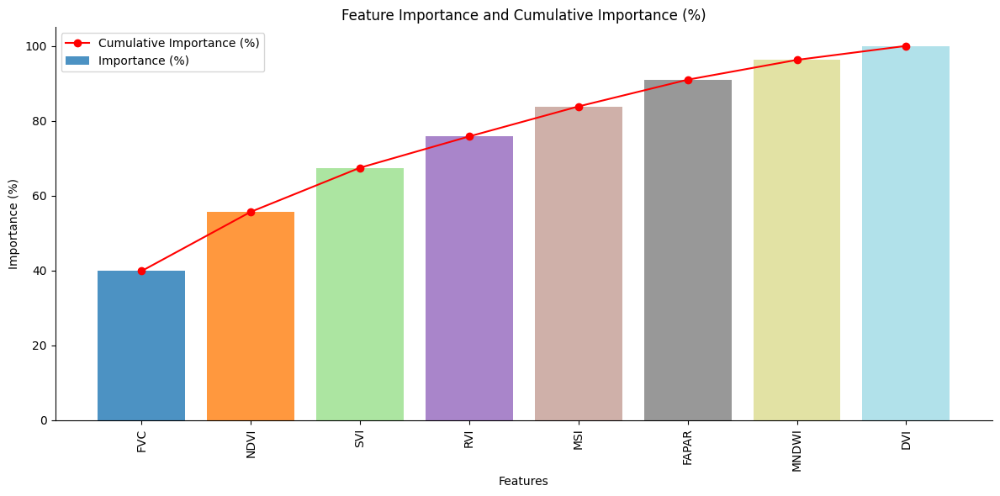

In [14]:
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Number of features
num_features = len(selected_features_df)

# Generate a color palette (e.g., using a colormap)
colors = cm.get_cmap('tab20', num_features).colors  # You can use 'tab10', 'Set3', etc.

# Set the figure size
plt.figure(figsize=(12, 6))

# Bar plot with different colors
plt.bar(
    selected_features_df['Feature'],
    selected_features_df['Cumulative Importance (%)'],
    color=colors,
    alpha=0.8,
    label='Importance (%)'
)

# Plot line for cumulative importance
plt.plot(
    selected_features_df['Feature'],
    selected_features_df['Cumulative Importance (%)'],
    color='red',
    marker='o',
    label='Cumulative Importance (%)'
)

# X-axis labels
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance (%)')

# Title and legend
plt.title('Feature Importance and Cumulative Importance (%)')
plt.legend()

# Remove top and right spines
plt.gca().spines[['top', 'right']].set_visible(False)

# Layout adjustment
plt.tight_layout()
plt.show()


In [ ]:
# prompt: download the plot

import matplotlib.pyplot as plt
plt.savefig("feature_importance_ch.png")

<Figure size 640x480 with 0 Axes>

In [15]:
# prompt: craete a datset that will have all the features from the selected_features_df that show 95% feature importance and add lat long

# Get the list of feature names that contribute to 95% feature importance
features_for_95_percent = selected_features_df[selected_features_df['Cumulative Importance (%)'] <= 97]['Feature'].tolist()

# Add 'latitude' and 'longitude' to the list of features
features_for_95_percent.extend(['latitude', 'longitude'])

# Create the new dataset with the selected features and lat/lon
dataset_95_percent_importance = data[features_for_95_percent].copy()

print("\nDataset with features contributing to 95% importance and lat/lon:")
print(dataset_95_percent_importance.head())
print("\nShape of the new dataset:", dataset_95_percent_importance.shape)
print("\nColumns in the new dataset:", dataset_95_percent_importance.columns.tolist())


Dataset with features contributing to 95% importance and lat/lon:
        FVC      NDVI       SVI       RVI       MSI     FAPAR     MNDWI  \
0  0.495036  0.497022  0.112426  2.976316  3.502632  0.621277 -0.580760   
1  0.503310  0.501986  0.123388  3.015951  3.388957  0.627483 -0.582808   
2  0.806587  0.683952  0.164354  5.328160  3.603104  0.854940 -0.495628   
3  0.788966  0.673380  0.153867  5.123318  3.715247  0.841725 -0.511172   
4  0.736024  0.641614  0.142246  4.580578  3.425620  0.802018 -0.498418   

    latitude  longitude  
0  21.876448  86.597818  
1  21.875100  86.596920  
2  21.874651  86.579852  
3  21.874202  86.579852  
4  21.873303  86.578953  

Shape of the new dataset: (4440, 9)

Columns in the new dataset: ['FVC', 'NDVI', 'SVI', 'RVI', 'MSI', 'FAPAR', 'MNDWI', 'latitude', 'longitude']


In [16]:
dataset_95_percent_importance.columns

Index(['FVC', 'NDVI', 'SVI', 'RVI', 'MSI', 'FAPAR', 'MNDWI', 'latitude',
       'longitude'],
      dtype='object')

In [17]:
import pandas as pd

# Create a DataFrame from the original y values (unscaled rh95)
original_y_df = pd.DataFrame(y, columns=['rh95'], index=dataset_95_percent_importance.index)

# Add only the original 'rh95' column to the dataset
dataset_95_percent_importance['rh95'] = original_y_df

# Optional: Print to verify
print("\nDataset with original rh95 added:")
print(dataset_95_percent_importance.head())


Dataset with original rh95 added:
        FVC      NDVI       SVI       RVI       MSI     FAPAR     MNDWI  \
0  0.495036  0.497022  0.112426  2.976316  3.502632  0.621277 -0.580760   
1  0.503310  0.501986  0.123388  3.015951  3.388957  0.627483 -0.582808   
2  0.806587  0.683952  0.164354  5.328160  3.603104  0.854940 -0.495628   
3  0.788966  0.673380  0.153867  5.123318  3.715247  0.841725 -0.511172   
4  0.736024  0.641614  0.142246  4.580578  3.425620  0.802018 -0.498418   

    latitude  longitude   rh95  
0  21.876448  86.597818   5.34  
1  21.875100  86.596920   3.10  
2  21.874651  86.579852  12.11  
3  21.874202  86.579852  14.39  
4  21.873303  86.578953   8.29  


In [18]:
X = dataset_95_percent_importance.drop(columns='rh95')
y = dataset_95_percent_importance[['rh95']]

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(3552, 9) (888, 9) (3552, 1) (888, 1)


In [20]:
#MULTIPLE LNEAR REGRESSION
from sklearn.linear_model import LinearRegression

# Initialize the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

# Print the coefficients
print("Coefficients:", model.coef_)

# Print the intercept
print("Intercept:", model.intercept_)

Coefficients: [[ 1.05343710e+02 -8.09121574e+01 -1.28283632e+02  3.92207329e+00
  -9.39199621e+00 -2.87212481e+01 -5.42750371e+01 -3.49377911e+00
   1.12282699e-01]]
Intercept: [84.86252047]


In [21]:
# Make predictions on the test data
y_pred = model.predict(X_test)

In [22]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, y_pred)

#Calculate Root Mean Squared Error
rmse=np.sqrt(mse)

# Calculate Mean Absolute Error
mae = mean_absolute_error(y_test, y_pred)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 23.841427308194636
Root Mean Squared Error: 4.882768406160038
Mean Absolute Error: 3.7730574482237382
R-squared: 0.5188709271002421


In [23]:
#DECISION TREE REGRESSOR
from sklearn.tree import DecisionTreeRegressor
reg1 = DecisionTreeRegressor(random_state=42)
reg1.fit(X_train, y_train)
reg1.predict(X_test)

array([23.530001  , 13.52000046, 14.51000023, 22.15999985,  3.25      ,
       20.290001  , 10.77999973,  7.69000006, 17.370001  , 20.18000031,
       15.19999981, 18.610001  ,  9.57999992, 15.39000034,  7.8499999 ,
       10.47000027, 14.07999992,  5.34000015, 20.14999962, 15.53999996,
        9.26000023, 14.97499991, 10.71000004,  9.28999996,  4.38000011,
        6.98000002, 11.28999996, 10.23999977, 17.969999  , 14.17000008,
       15.42000008,  3.73000002,  3.44000006,  2.16000009,  1.94000006,
       15.39000034, 17.190001  ,  2.08999991,  2.20000005, 11.93999958,
       16.43000031, 21.65999985, 13.90999985,  2.08999991,  5.67999983,
       16.620001  , 14.30000019, 19.40999985,  3.18000007,  4.28999996,
        7.80000019,  2.3499999 ,  8.44999981, 12.09000015, 15.53999996,
       16.139999  , 13.75      , 14.22999954, 11.93999958, 16.26000023,
       19.14999962, 14.33500004,  2.99000001, 25.360001  , 14.98999977,
       13.19999981, 20.440001  , 14.56000042, 21.01000023, 22.5 

In [24]:
reg1.score(X_test, y_test)

0.2374962464464342

In [25]:
predictions=reg1.predict(X_test)

In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, predictions)

#Calculate Root Mean Squared Error
rmse=np.sqrt(mse)

# Calculate Mean Absolute Error
mae = mean_absolute_error(y_test,predictions)
# Calculate R-squared
r2 = r2_score(y_test,predictions)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 37.784409291683936
Root Mean Squared Error: 6.1469024143615565
Mean Absolute Error: 4.449236124473161
R-squared: 0.2374962464464342


In [27]:
#RANDOM FOREST REGRESSOR
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor(random_state=42)
reg.fit(X_train, y_train)
reg.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


array([17.12199988, 17.55296684, 13.97639999, 17.28596638, 10.31610001,
       19.10840001,  9.32670006, 10.81068006, 17.67010029, 18.33773332,
       14.45266663, 17.57096675, 12.84120001, 14.54310008, 11.07934997,
        8.78488327, 10.49630003,  7.41540004, 20.55693368, 16.53119997,
       13.49850019, 14.68328655, 12.69839997, 15.37476652, 15.51940002,
        9.36319994, 11.18436668, 13.66699988, 17.92636634, 16.30739992,
       10.73520004,  4.52303334,  5.2472    ,  2.88420006,  2.84804999,
       16.85226685, 16.19884186,  4.67910001,  3.78033338, 11.46680001,
        9.4933249 , 15.66754695, 10.54919991,  8.86280001,  7.48807505,
       14.76334997, 14.90895003, 15.32213977,  8.53529995,  5.47580003,
        7.61410006,  2.92735   , 11.483175  , 13.48910015, 16.17489995,
       13.21315831,  7.93489999, 15.89119981, 13.23079986, 20.54163321,
       17.9466002 , 12.92006678,  7.5381084 , 14.21414995, 20.38035017,
       14.03810005, 20.66650021, 13.42519995, 18.14060017, 14.17

In [28]:
reg.score(X_test, y_test)

0.5649850650232018

In [29]:
predictions=reg.predict(X_test)

In [30]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, predictions)

#Calculate Root Mean Squared Error
rmse=np.sqrt(mse)

# Calculate Mean Absolute Error
mae = mean_absolute_error(y_test,predictions)
# Calculate R-squared
r2 = r2_score(y_test,predictions)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 21.55632975517403
Root Mean Squared Error: 4.642879468085945
Mean Absolute Error: 3.4881804336959923
R-squared: 0.5649850650232018


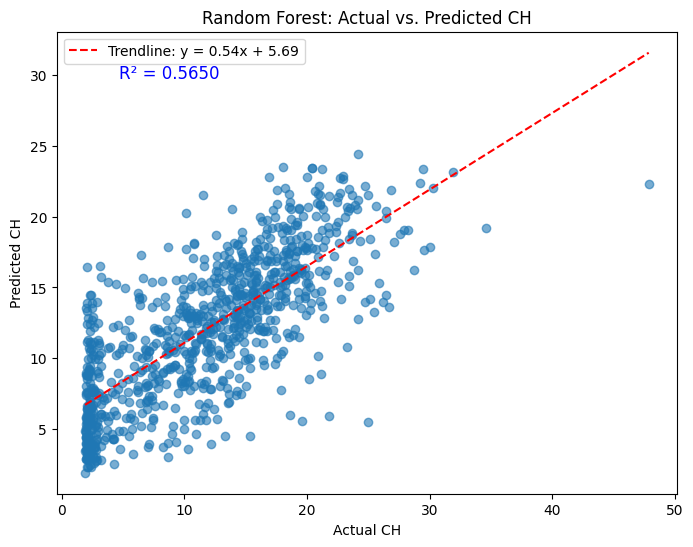

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score

# Assuming 'reg' is the trained RandomForestRegressor model
# Assuming X_test and y_test are available

# Make predictions
predictions = reg.predict(X_test)

# Calculate R-squared score
r2 = r2_score(y_test, predictions)

# Plotting
plt.figure(figsize=(8, 6))

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions, alpha=0.6)

# Ensure that y_test and predictions are 1D arrays (vectors)
y_test = np.ravel(y_test)  # Flatten y_test to 1D if it's not already
predictions = np.ravel(predictions)  # Flatten predictions to 1D if needed

# Calculate the trendline (y = mx + b) using numpy's polyfit
m, b = np.polyfit(y_test, predictions, 1)  # Linear fit: slope (m) and intercept (b)

# Plot the trendline (y = mx + b)
plt.plot([y_test.min(), y_test.max()], [m * y_test.min() + b, m * y_test.max() + b], color='red', linestyle='--', label=f'Trendline: y = {m:.2f}x + {b:.2f}')

# Display R² score on the plot
plt.text(0.1, 0.9, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12, color='blue')

# Label the axes
plt.xlabel('Actual CH')
plt.ylabel('Predicted CH')

# Title and legend
plt.title('Random Forest: Actual vs. Predicted CH')
plt.legend()

# Remove gridlines
plt.grid(False)

# Show the plot
plt.show()


Training R² Score: 0.4814
Testing R² Score: 0.5189


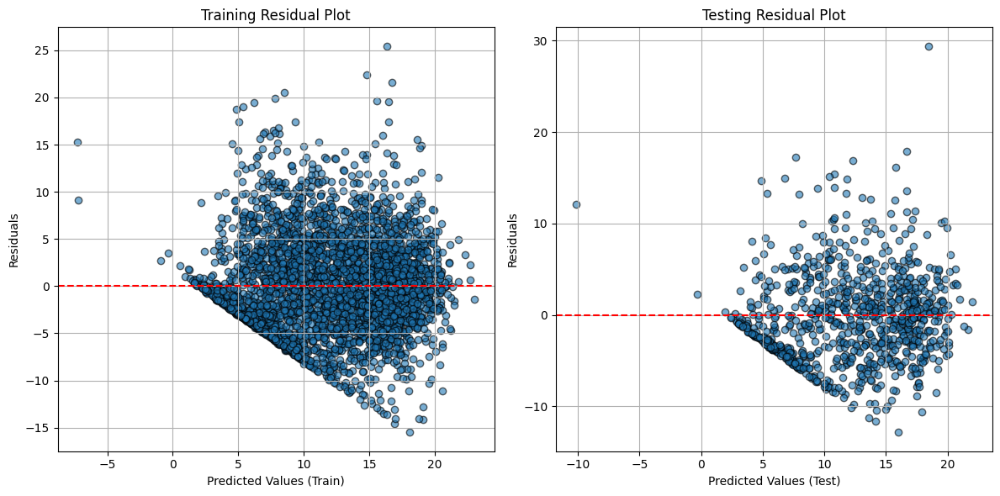

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Ensure y values are 1D numpy arrays
y_train = np.array(y_train).ravel()
y_test = np.array(y_test).ravel()

# Predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Ensure predictions are also 1D
y_train_pred = np.array(y_train_pred).ravel()
y_test_pred = np.array(y_test_pred).ravel()

# R² Scores
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f'Training R² Score: {r2_train:.4f}')
print(f'Testing R² Score: {r2_test:.4f}')

# Residuals
residuals_train = y_train - y_train_pred
residuals_test = y_test - y_test_pred

# Residual Plot
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
plt.scatter(y_train_pred, residuals_train, alpha=0.6, edgecolor='k')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values (Train)')
plt.ylabel('Residuals')
plt.title('Training Residual Plot')
plt.grid(True)

# Testing residuals
plt.subplot(1, 2, 2)
plt.scatter(y_test_pred, residuals_test, alpha=0.6, edgecolor='k')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values (Test)')
plt.ylabel('Residuals')
plt.title('Testing Residual Plot')
plt.grid(True)

plt.tight_layout()
plt.show()


In [40]:
# prompt: apply the random forest model to the X dataset and create a map

import pandas as pd
!pip install folium
import folium

# Get the original 'latitude' and 'longitude' columns from the test set
# We use the original X (before scaling and feature selection) to get lat/lon for test samples
# Ensure the index aligns between X_test and the original data
X_test_original_latlon = X_test_dropped[['latitude', 'longitude']].copy()
X_test_original_latlon = X_test_original_latlon.reset_index(drop=True) # Reset index to align with predictions

# Ensure predictions are a pandas Series or NumPy array
predictions_series = pd.Series(predictions.ravel(), name='Predicted_CH')

# Combine lat/lon with predictions
map_data = pd.concat([X_test_original_latlon, predictions_series], axis=1)

# Create a base map centered around the mean latitude and longitude
map_center = [map_data['latitude'].mean(), map_data['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=4)

# Add markers for each predicted point
for index, row in map_data.iterrows():
  folium.Marker(
      location=[row['latitude'], row['longitude']],
      popup=f"Predicted CH: {row['Predicted_CH']:.2f}", # Display predicted value in popup
      tooltip=f"Lat: {row['latitude']:.2f}, Lon: {row['longitude']:.2f}, Pred CH: {row['Predicted_CH']:.2f}" # Display info on hover
  ).add_to(m)

# Display the map
m

In [48]:
# Convert each row to an ee.Feature
def row_to_feature(row):
    geom = ee.Geometry.Point([row['longitude'], row['latitude']])
    return ee.Feature(geom, row.to_dict())

features = X.apply(row_to_feature, axis=1).tolist()

# Create a FeatureCollection
fc = ee.FeatureCollection(features)

print(fc.size().getInfo())

4440


In [50]:
# Select bands
# Use the columns from X, which are the features used for training the model
bands = X.columns.tolist()
selected = fc.select(bands)

# Classify using the classifier and rename output band as 'predicted'
# Assuming 'reg1' is the Decision Tree Regressor from earlier cells
regression = selected.classify(reg1).rename('predicted')

# Clip to region of interest
# Assuming 'roi' is defined somewhere in the notebook. If not, this line will cause an error.
# For now, I will keep it but note that 'roi' needs to be defined.
# If 'roi' is not defined, you might want to remove this line or define a default ROI.
# regression_clipped = regression.clip(roi)

# To visualize, set visualization parameters
vis_params = {
    'min': 0, # Adjust min/max based on your predicted values
    'max': 40, # Adjust min/max based on your predicted values
    'palette': ['yellow', 'green'] # Adjust palette as needed
}

# Add layer to the map (only works if you use geemap or similar library)
import geemap

# Initialize the map - geemap requires Earth Engine authentication and initialization.
# Assuming ee.Initialize() has been run in a previous cell or is handled by geemap.
Map = geemap.Map()
# Map.centerObject(roi) # This also requires 'roi' to be defined

# Add the classified layer to the map
# If you commented out the clipping, use 'regression' instead of 'regression_clipped'
Map.addLayer(regression, vis_params, 'Predicted TCH')

Map

TypeError: Classifier can only be used as a cast to Classifier. Found <class 'sklearn.tree._classes.DecisionTreeRegressor'>.

In [ ]:
# prompt: make a map from the predicted output

import pandas as pd
!pip install folium

import folium

# Create a DataFrame for the test set including lat/lon and predicted/actual rh95
# We need the original latitude and longitude from the test set
# X_test_dropped contains the original latitude and longitude for the test set
# The index of y_test corresponds to the index of X_test_dropped
# Let's merge the predictions with the original test set data which includes lat/lon

# Create a DataFrame for predictions
y_pred_df = pd.DataFrame(predictions, columns=['predicted_rh95'], index=y_test.index)

# Get the original test data including latitude and longitude
# We need to make sure the indices align between y_test and the original data's test split
# A robust way is to use the index of y_test to select rows from the original data
original_test_data_with_latlon = data.loc[y_test.index][['latitude', 'longitude', 'rh95']].copy()

# Merge predictions with the original test data
map_data = original_test_data_with_latlon.copy()
map_data['predicted_rh95'] = y_pred_df

# Create a base map centered at the mean latitude and longitude of the test set
map_center_lat = map_data['latitude'].mean()
map_center_lon = map_data['longitude'].mean()

m = folium.Map(location=[map_center_lat, map_center_lon], zoom_start=5)

# Add markers for each point in the test set
for index, row in map_data.iterrows():
  folium.CircleMarker(
      location=[row['latitude'], row['longitude']],
      radius=5,  # Adjust radius as needed
      color='blue',
      fill=True,
      fill_color='blue',
      fill_opacity=0.6,
      tooltip=f"Actual RH95: {row['rh95']:.2f}<br>Predicted RH95: {row['predicted_rh95']:.2f}"
  ).add_to(m)

# Display the map
m

In [ ]:
# prompt: make a continuous map for the roi

# The previous map showed individual points.
# To create a continuous map representing the predicted values over the ROI,
# we typically need to perform spatial interpolation or use a method that generates a surface.
# Since we only have scattered points, we can't directly create a true continuous surface
# without further processing (like kriging, IDW, or using a spatial model).
# However, we can visualize the predicted values using a heatmap-like approach or
# color-coding points based on their predicted values.

# Let's create a map where the color of each point represents the predicted rh95 value.
# We will use a color scale to show the variation.

# Create a base map centered at the mean latitude and longitude of the test set
map_center_lat = map_data['latitude'].mean()
map_center_lon = map_data['longitude'].mean()

m_continuous = folium.Map(location=[map_center_lat, map_center_lon], zoom_start=5)

# Define a color scale based on the range of predicted rh95 values
min_pred = map_data['predicted_rh95'].min()
max_pred = map_data['predicted_rh95'].max()

# Use a colormap from matplotlib (e.g., 'viridis', 'plasma', 'inferno', 'magma')
import matplotlib.cm as cm
import matplotlib.colors as colors

# Choose a colormap (e.g., 'viridis')
cmap = cm.get_cmap('viridis')
# Normalize the predicted values to the range [0, 1]
norm = colors.Normalize(vmin=min_pred, vmax=max_pred)

# Add CircleMarkers colored by predicted value
for index, row in map_data.iterrows():
  # Get the color from the colormap based on the normalized predicted value
  color = colors.to_hex(cmap(norm(row['predicted_rh95'])))

  folium.CircleMarker(
      location=[row['latitude'], row['longitude']],
      radius=5,  # Adjust radius as needed
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7,
      tooltip=f"Actual RH95: {row['rh95']:.2f}<br>Predicted RH95: {row['predicted_rh95']:.2f}"
  ).add_to(m_continuous)

# Optional: Add a color bar legend (requires additional steps, e.g., using branca)
# !pip install branca
# import branca.colormap as cm

# colormap = cm.LinearColormap(['viridis'], vmin=min_pred, vmax=max_pred, caption='Predicted RH95')
# m_continuous.add_child(colormap)


# Display the map
m_continuous

In [ ]:
# prompt: make a rh 95map for the entires tudy area

# To create a map for the *entire study area* (not just the test set),
# we need to predict rh95 for all points in the original 'data' DataFrame
# using the trained Random Forest Regressor model (reg).

# 1. Prepare the entire dataset for prediction
# Use the features identified as important from the 95% selection process
# RFE was run on data *without* lat/lon, then lat/lon were added back to dataset_95_percent_importance.
# The final models (MLR, DT, RF) were trained on X derived from dataset_95_percent_importance,
# which INCLUDED latitude and longitude.
# Therefore, X_full for prediction must also include latitude and longitude.
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()

# Select the features used for training from the original data
# Use the columns from the X derived from dataset_95_percent_importance, which includes lat/lon
X_full = data[features_for_prediction].copy()

# 2. Predict rh95 for the entire study area using the best model (Random Forest)
# Ensure the regressor model is trained on the features from the 95% selection
# We trained 'reg' (RandomForestRegressor) on X_train which already has the selected features
full_predictions = reg.predict(X_full)

# 3. Create a new DataFrame with latitude, longitude, and the predicted rh95 for the full dataset
# We need latitude and longitude from the original data for mapping
full_map_data = data[['latitude', 'longitude']].copy()
full_map_data['predicted_rh95'] = full_predictions

# 4. Create a base map centered at the mean latitude and longitude of the *entire* study area
map_center_lat_full = full_map_data['latitude'].mean()
map_center_lon_full = full_map_data['longitude'].mean()

m_full_study_area = folium.Map(location=[map_center_lat_full, map_center_lon_full], zoom_start=5)

# 5. Define a color scale based on the range of predicted rh95 values for the full dataset
min_pred_full = full_map_data['predicted_rh95'].min()
max_pred_full = full_map_data['predicted_rh95'].max() # Corrected typo here


# Use a colormap from matplotlib for point coloring
import matplotlib.cm as mpl_cm # Use a different alias for matplotlib.cm
import matplotlib.colors as mpl_colors

cmap_full = mpl_cm.get_cmap('viridis') # Use the matplotlib colormap for coloring points
norm_full = mpl_colors.Normalize(vmin=min_pred_full, vmax=max_pred_full)

# 6. Add CircleMarkers colored by predicted value for each point in the full dataset
for index, row in full_map_data.iterrows():
  # Get the color from the colormap based on the normalized predicted value
  color_full = mpl_colors.to_hex(cmap_full(norm_full(row['predicted_rh95'])))

  folium.CircleMarker(
      location=[row['latitude'], row['longitude']],
      radius=2,  # Adjust radius for better visualization with more points
      color=color_full,
      fill=True,
      fill_color=color_full,
      fill_opacity=0.7,
      tooltip=f"Predicted RH95: {row['predicted_rh95']:.2f}"
  ).add_to(m_full_study_area)

# 7. Optional: Add a color bar legend (requires branca)
# !pip install branca
import branca.colormap as branca_cm # Use a different alias for branca.colormap

# Use branca.colormap.LinearColormap for the legend
colormap_full = branca_cm.LinearColormap(
    ['#440154', '#472C7A', '#3B528B', '#2C728E', '#21908C', '#27AD81', '#5EC962', '#A0DA39', '#FDE725'], # Viridis colors
    vmin=min_pred_full, vmax=max_pred_full, caption='Predicted RH95'
)
m_full_study_area.add_child(colormap_full)


# 8. Display the map for the entire study area
m_full_study_area

/tmp/ipython-input-32-1709545277.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_full = mpl_cm.get_cmap('viridis') # Use the matplotlib colormap for coloring points



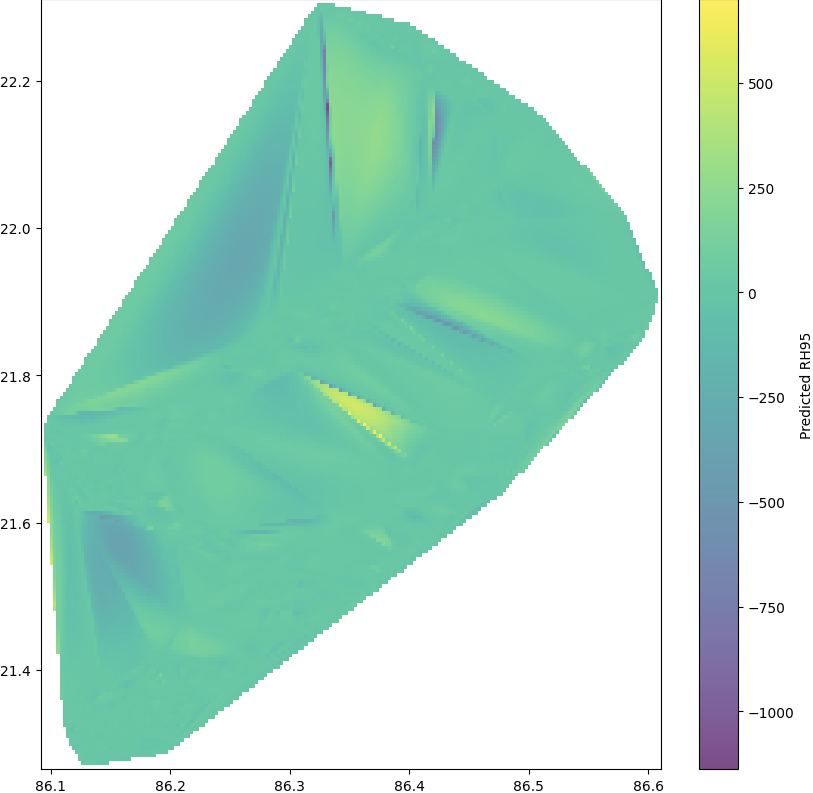

In [ ]:
# prompt: modify rhe above code to make  a continuous surface

import matplotlib.pyplot as plt
import numpy as np
import folium
import io
import base64 # Import the base64 module
from scipy.interpolate import griddata
import matplotlib.cm as mpl_cm
import matplotlib.colors as mpl_colors
import branca.colormap as branca_cm
import pandas as pd # Import pandas

# To create a continuous surface representation, we need to move beyond point markers.
# Common methods include:
# 1. Heatmap: Shows the density of points, which can be misleading for representing a predicted value surface.
# 2. Grid Interpolation: Predict values on a regular grid covering the ROI and then visualize the grid as a surface.
# 3. Kriging/IDW: Geostatistical interpolation methods to create a smooth surface.

# Given the current setup (scattered points), the simplest way to approximate a
# continuous surface *visualization* in Folium is to use a HeatMap.
# However, a standard Folium HeatMap is designed for point density.
# To visualize the *predicted value* as a surface, we would ideally use a
# spatial interpolation library (like `scipy.interpolate.griddata` or
# geostatistical tools) to predict values on a grid and then display that grid.

# Let's demonstrate creating a predicted value surface using a simple grid interpolation
# and then visualizing it on Folium.

# This requires creating a meshgrid over the latitude and longitude range
# and then using the trained model to predict values for all points on this grid.

# --- Method: Grid Interpolation and Folium ImageOverlay ---

# 1. Define the spatial extent of the grid based on the data
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()

# 2. Create a grid of latitude and longitude points
# Adjust the number of points (e.g., 100x100) based on desired resolution and computation time
grid_points = 200 # Increased points for higher resolution
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

# Flatten the grid points for prediction
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

# 3. Prepare the feature inputs for the grid points
# We need to create input data for the model for all grid points.
# The trained Random Forest model ('reg') expects features from X_train.columns.
# These include 'latitude', 'longitude', and the other selected features.
# For grid points, we only have latitude and longitude. We need to decide how to handle
# the other features. A common approach is to use interpolation for the other features
# based on their values at the original data points.
# However, a simpler (but less accurate) approach for demonstration is to assume
# the other features are constant or use average values across the ROI, which is not ideal.

# A more robust approach is to predict rh95 using a spatial model trained on lat/lon
# or use a different approach like Universal Kriging if you want to include other features spatially.

# Given the current model (`reg`) is trained on lat/lon + other features,
# and we only have lat/lon on the grid, we cannot directly use `reg` to predict
# on the grid without somehow estimating the other feature values on the grid.

# Let's try predicting just based on lat/lon for the grid, assuming a simplified model
# or a spatial interpolation method. Since our current model *uses* other features,
# predicting only on lat/lon grid will not use the full model's capability.

# A better approach for visualizing the model's predictions as a surface
# is to predict on the original data points, and then use a spatial interpolation
# method (like `griddata`) to interpolate these *predicted values* onto the grid.

# --- Refined Method: Predict on Original Points, then Interpolate to Grid ---

# 1. Use the existing Random Forest model ('reg') to predict rh95 for the *entire original dataset*.
# This prediction uses all the features (including lat/lon) that the model was trained on.
# Ensure X_full is correctly defined to match the features used in training 'reg'
# X_full was defined in the previous cell based on dataset_95_percent_importance columns minus 'rh95'
# This includes latitude and longitude and the other important features.
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy() # Re-create X_full just to be sure

full_data_predictions = reg.predict(X_full)

# 2. Create a DataFrame with original lat/lon and the full data predictions
points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

# 3. Define the spatial extent of the grid based on the original data
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()

# 4. Create a grid of latitude and longitude points for interpolation
grid_points = 200 # Increased points for higher resolution
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

# 5. Interpolate the predicted rh95 values onto the grid
# Get the coordinates and values from the points_for_interpolation DataFrame
points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values

# Define the grid coordinates
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

# Perform interpolation. 'cubic' often gives a smoother surface.
# 'nearest', 'linear', 'cubic' are options. 'nearest' is fastest but blocky.
# 'linear' is linear interpolation. 'cubic' is cubic interpolation (smoother).
# `fill_value` can be used for points outside the convex hull of the data.
interpolated_grid_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)

# Reshape the interpolated values back to the grid shape
interpolated_rh95_surface = interpolated_grid_values.reshape(lat_mesh.shape)

# 6. Create a base map centered at the mean latitude and longitude of the study area
map_center_lat_full = data['latitude'].mean()
map_center_lon_full = data['longitude'].mean()

m_surface = folium.Map(location=[map_center_lat_full, map_center_lon_full], zoom_start=5)

# 7. Visualize the interpolated surface using a Folium ImageOverlay
# We need to convert the interpolated grid data into an image format or array suitable for overlay.
# A simple way is to use Matplotlib to create an image of the array and then overlay it.

# Create a Matplotlib figure without displaying it
fig, ax = plt.subplots(figsize=(10, 10))
# Use `imshow` to display the interpolated values. `origin='lower'` is important
# because `imshow`'s origin is typically upper left, while geographic data is lower left.
# `aspect='auto'` to avoid distortion if lat/lon ranges are different.
im = ax.imshow(interpolated_rh95_surface, extent=[lon_min, lon_max, lat_min, lat_max],
               origin='lower', cmap='viridis', aspect='auto', alpha=0.7) # alpha for transparency

# Add a colorbar to the matplotlib figure
fig.colorbar(im, ax=ax, label='Predicted RH95')

# Save the Matplotlib figure to a temporary buffer
buf = io.BytesIO()
plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
buf.seek(0)
plt.close(fig) # Close the figure to avoid displaying it

# Convert the image bytes to a base64 string
img_base64 = base64.b64encode(buf.read()).decode('utf-8')

# Create the image URL for Folium
# The format is 'data:image/png;base64,' followed by the base64 string
image_url = f'data:image/png;base64,{img_base64}'

# 8. Add the image overlay to the Folium map
# The bounds for the image overlay should match the extent used in imshow
bounds = [(lat_min, lon_min), (lat_max, lon_max)]

folium.raster_layers.ImageOverlay(
    image=image_url, # Use the base64 encoded image URL
    bounds=bounds,
    # colormap=lambda x: mpl_colors.to_hex(cmap_full(x)), # This is not needed when passing a direct image URL
    opacity=0.7,
    name='Predicted RH95 Surface'
).add_to(m_surface)

# Optional: Add the color bar legend from branca
# Re-create the branca colormap
# Use the full range of predicted values from the *full* data predictions for the colormap
min_pred_full = full_data_predictions.min()
max_pred_full = full_data_predictions.max()

"""
colormap_full_branca = branca_cm.LinearColormap(
    ['#440154', '#472C7A', '#3B528B', '#2C728E', '#21908C', '#27AD81', '#5EC962', '#A0DA39', '#FDE725'], # Viridis colors
    vmin=min_pred_full, vmax=max_pred_full, caption='Predicted RH95'
)
m_surface.add_child(colormap_full_branca)
"""

# Add a layer control to toggle the surface on/off
folium.LayerControl().add_to(m_surface)


# 9. Display the map with the surface
m_surface


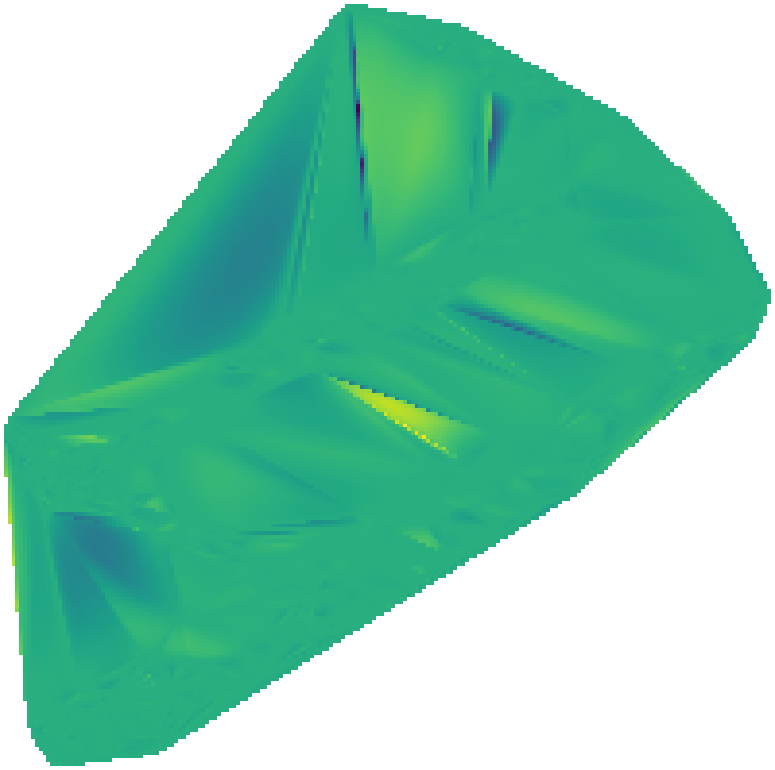

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import folium
import io
import base64
from scipy.interpolate import griddata
import pandas as pd

# --- Assume the following are already defined ---
# `data`: your DataFrame with features
# `reg`: trained regression model (e.g., RandomForestRegressor)
# `dataset_95_percent_importance`: dataframe of selected features with 'rh95'

# 1. Predict RH95 on the full dataset
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

# 2. Prepare DataFrame with coordinates and predictions
points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

# 3. Create grid over spatial extent
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

# 4. Interpolate predictions to grid
points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
interpolated_grid_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_rh95_surface = interpolated_grid_values.reshape(lat_mesh.shape)

# 5. Create image from interpolated surface using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis('off')  # Hide axis
im = ax.imshow(interpolated_rh95_surface, extent=[lon_min, lon_max, lat_min, lat_max],
               origin='lower', cmap='viridis', aspect='auto', alpha=1.0)
buf = io.BytesIO()
plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0, transparent=True)
buf.seek(0)
plt.close(fig)

# 6. Convert image to base64 for Folium overlay
img_base64 = base64.b64encode(buf.read()).decode('utf-8')
image_url = f'data:image/png;base64,{img_base64}'

# 7. Create Folium map and overlay image
map_center = [data['latitude'].mean(), data['longitude'].mean()]
m_surface = folium.Map(location=map_center, zoom_start=5, control_scale=True)
bounds = [(lat_min, lon_min), (lat_max, lon_max)]

folium.raster_layers.ImageOverlay(
    image=image_url,
    bounds=bounds,
    opacity=1.0,
    name='Predicted RH95 Surface'
).add_to(m_surface)

# 8. Show the map (use m_surface._repr_html_() if in a notebook)
m_surface


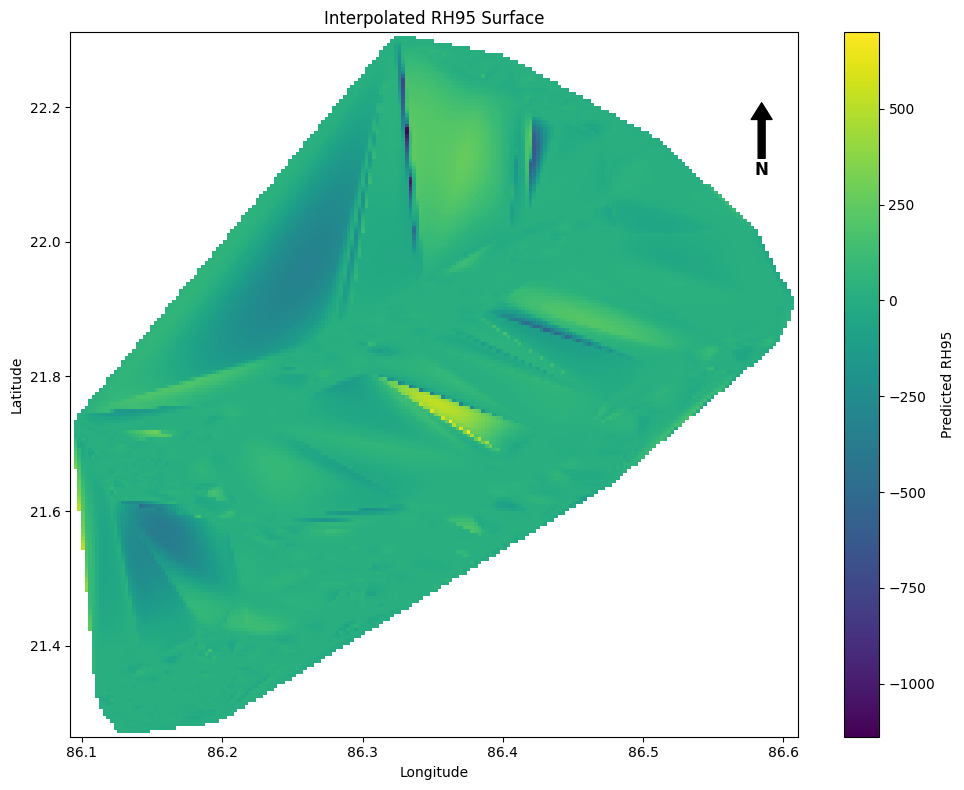

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import io
from scipy.interpolate import griddata
import pandas as pd

# --- Step 1: Predict RH95 using your model ---
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

# --- Step 2: Create DataFrame with coordinates and predictions ---
points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

# --- Step 3: Create a grid over your spatial extent ---
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

# --- Step 4: Interpolate the model predictions onto the grid ---
points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Step 5: Plot the surface with latitude, longitude, colorbar, and north arrow ---
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')

# Set labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Interpolated RH95 Surface')

# Add colorbar
cbar = fig.colorbar(c, ax=ax, label='Predicted RH95')

# Add North Arrow
# Simple arrow using annotate
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1

# Arrow points downward: arrow ends below text
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


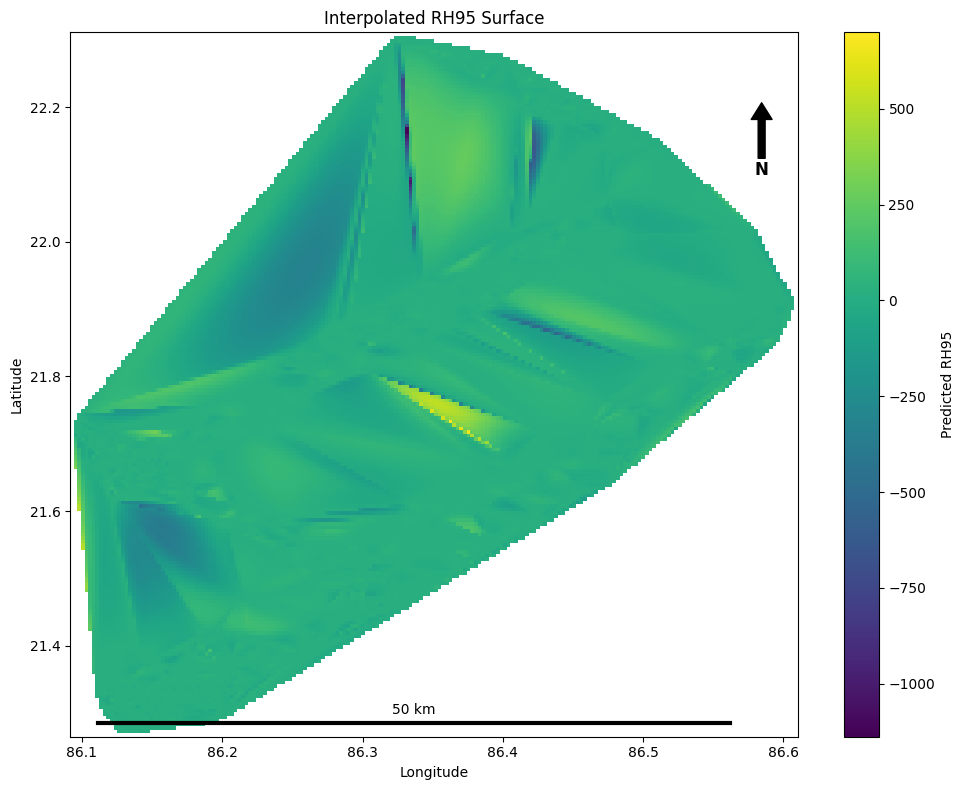

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

# --- Same prediction and interpolation steps as before ---
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 8))

# Interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Interpolated RH95 Surface')
fig.colorbar(c, ax=ax, label='Predicted RH95')

# --- North arrow (pointing down) ---
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# --- Add scale bar ---
# Approximate 1 degree latitude ≈ 111 km
scale_km = 50  # desired scale bar length in km
scale_deg = scale_km / 111  # convert to degrees
bar_lon_start = lon_min + 0.02
bar_lat = lat_min + 0.02
bar_lon_end = bar_lon_start + scale_deg

# Draw the scale bar
ax.plot([bar_lon_start, bar_lon_end], [bar_lat, bar_lat], color='black', linewidth=3)
ax.text((bar_lon_start + bar_lon_end) / 2, bar_lat + 0.01, f'{scale_km} km',
        ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


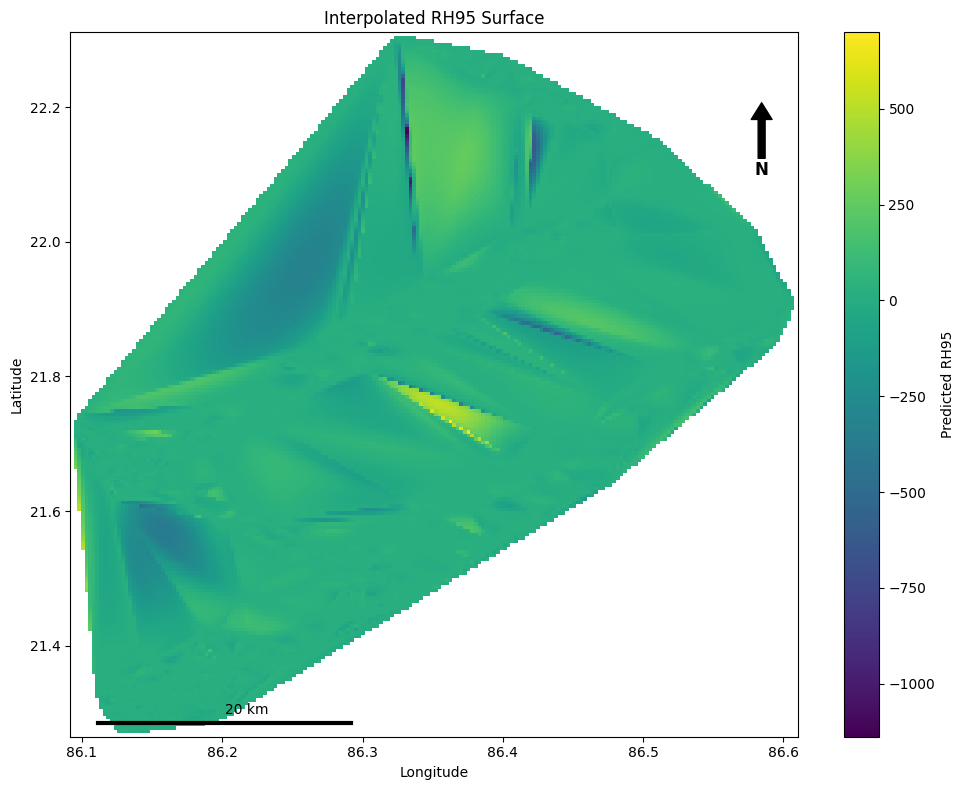

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

# --- Same prediction and interpolation steps as before ---
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 8))

# Interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Interpolated RH95 Surface')
fig.colorbar(c, ax=ax, label='Predicted RH95')

# --- North arrow (pointing down) ---
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# --- Add scale bar ---
# Approximate 1 degree latitude ≈ 111 km
scale_km = 20  # desired scale bar length in km
scale_deg = scale_km / 111  # convert to degrees
bar_lon_start = lon_min + 0.02
bar_lat = lat_min + 0.02
bar_lon_end = bar_lon_start + scale_deg

# Draw the scale bar
ax.plot([bar_lon_start, bar_lon_end], [bar_lat, bar_lat], color='black', linewidth=3)
ax.text((bar_lon_start + bar_lon_end) / 2, bar_lat + 0.01, f'{scale_km} km',
        ha='left', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


/tmp/ipython-input-51-2352301475.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


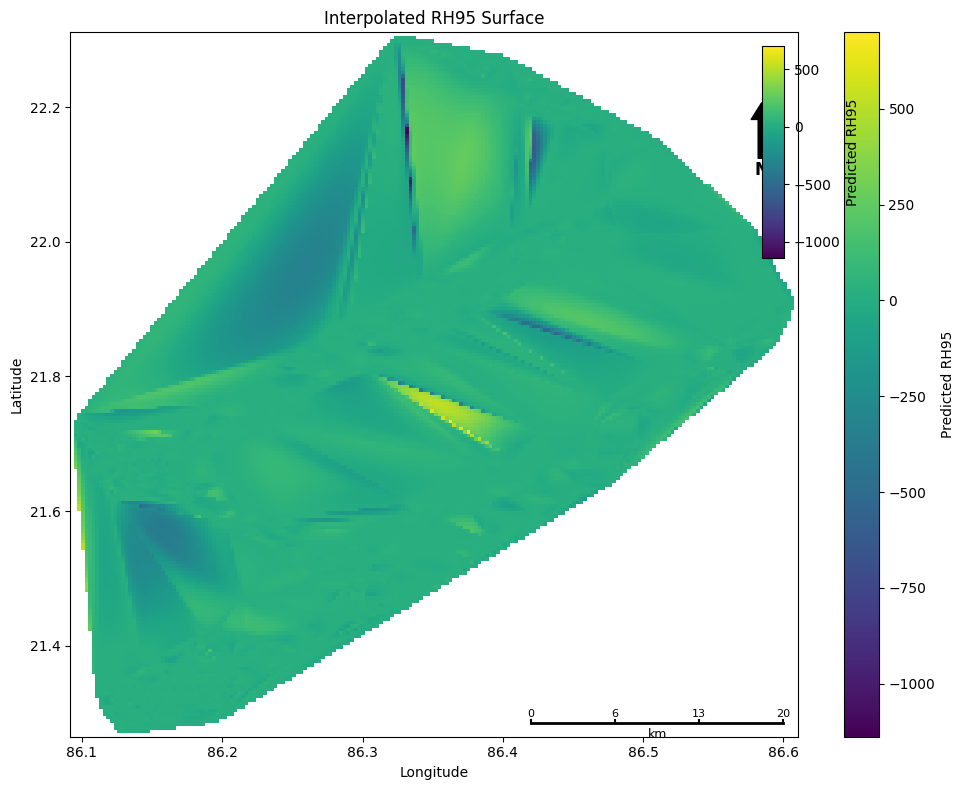

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# --- Prediction and interpolation steps (same as before) ---
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Plot the interpolated surface ---
fig, ax = plt.subplots(figsize=(10, 8))

c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Interpolated RH95 Surface')
fig.colorbar(c, ax=ax, label='Predicted RH95')

# --- North arrow (pointing down) ---
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# --- Scale bar (bottom-right, 4 tick marks) ---
scale_km = 20
segments = 3
scale_deg = scale_km / 111  # Convert to degrees (approx.)
segment_deg = scale_deg / segments

# Margin from edges (in degrees)
lon_margin = (lon_max - lon_min) * 0.02
lat_margin = (lat_max - lat_min) * 0.02

# Bar start and end positions (right-aligned)
bar_right = lon_max - lon_margin
bar_left = bar_right - scale_deg
bar_bottom = lat_min + lat_margin

# Draw main line of the scale bar
ax.plot([bar_left, bar_right], [bar_bottom, bar_bottom], color='black', linewidth=2)

# Draw ticks and labels
for i in range(segments + 1):  # 0 to 3 (4 ticks)
    tick_x = bar_left + i * segment_deg
    ax.plot([tick_x, tick_x], [bar_bottom, bar_bottom + 0.004], color='black', linewidth=1.5)
    label_km = int(i * (scale_km / segments))
    ax.text(tick_x, bar_bottom + 0.006, f"{label_km}", ha='center', va='bottom', fontsize=8)

# Label "km" under the bar
ax.text((bar_left + bar_right) / 2, bar_bottom - 0.008, "km", ha='center', va='top', fontsize=9)

# Add colorbar inside the plot (inset)
cax = inset_axes(ax, width="3%", height="30%", loc='upper right', borderpad=1)
cb = fig.colorbar(c, cax=cax, orientation='vertical')
cb.set_label('Predicted RH95')

plt.tight_layout()
plt.show()


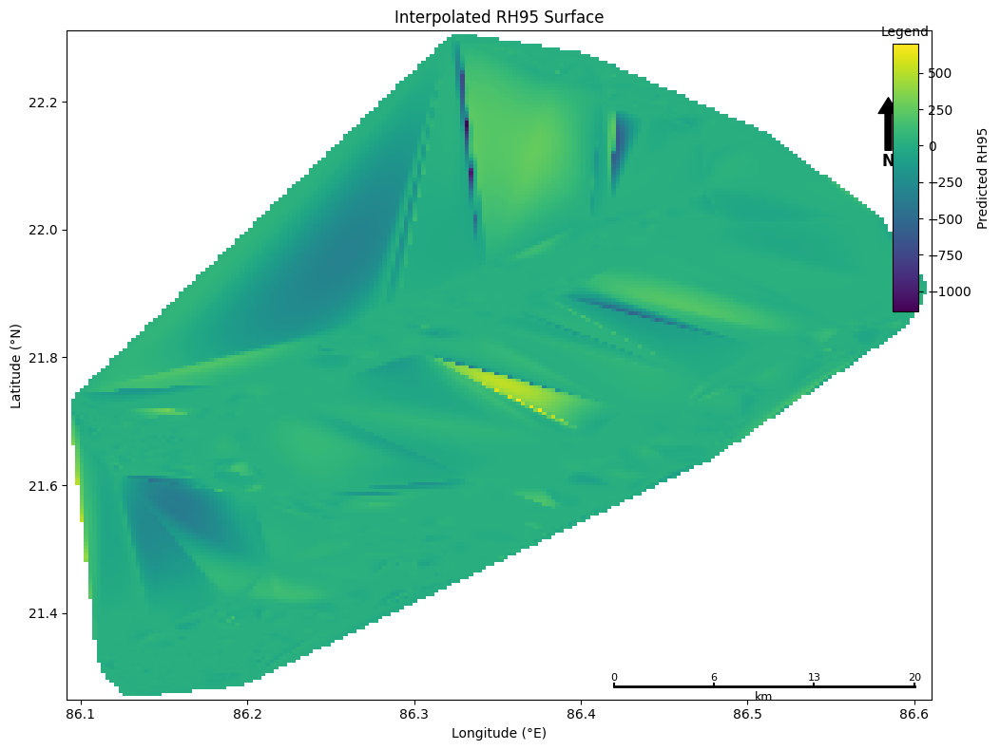

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Assume these variables are already defined:
# data (your DataFrame with 'latitude', 'longitude', and features)
# dataset_95_percent_importance (DataFrame with features including 'rh95')
# reg (your trained RandomForestRegressor model)

# 1. Prepare features and predict on full data
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

# 2. Create DataFrame with lat/lon and predicted values
points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

# 3. Define grid extent
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()

# 4. Create interpolation grid
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

# 5. Interpolate predicted values to grid
points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 8))

# 6. Show interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')

# 7. Axis labels with degree symbols
ax.set_xlabel('Longitude (°E)')
ax.set_ylabel('Latitude (°N)')
ax.set_title('Interpolated RH95 Surface')

# 8. Colorbar inset inside plot with title and label
cax = inset_axes(ax, width="3%", height="40%", loc='upper right', borderpad=1)
cb = fig.colorbar(c, cax=cax, orientation='vertical')
cb.set_label('Predicted RH95')
cb.ax.set_title('Legend', fontsize=10)

# 9. North arrow pointing down (reversed)
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# 10. Scale bar at bottom right with 4 tick marks, reduced size (20 km)
scale_km = 20
segments = 3
scale_deg = scale_km / 111  # approx. conversion km to degrees
segment_deg = scale_deg / segments

lon_margin = (lon_max - lon_min) * 0.02
lat_margin = (lat_max - lat_min) * 0.02

bar_right = lon_max - lon_margin
bar_left = bar_right - scale_deg
bar_bottom = lat_min + lat_margin

# Draw scale bar line
ax.plot([bar_left, bar_right], [bar_bottom, bar_bottom], color='black', linewidth=2)

# Draw ticks and labels
for i in range(segments + 1):
    tick_x = bar_left + i * segment_deg
    ax.plot([tick_x, tick_x], [bar_bottom, bar_bottom + 0.004], color='black', linewidth=1.5)
    label_km = int(i * (scale_km / segments))
    ax.text(tick_x, bar_bottom + 0.006, f"{label_km}", ha='center', va='bottom', fontsize=8)

# Label "km" under the scale bar
ax.text((bar_left + bar_right) / 2, bar_bottom - 0.008, "km", ha='center', va='top', fontsize=9)

plt.tight_layout()
plt.show()


/tmp/ipython-input-81-1482593015.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


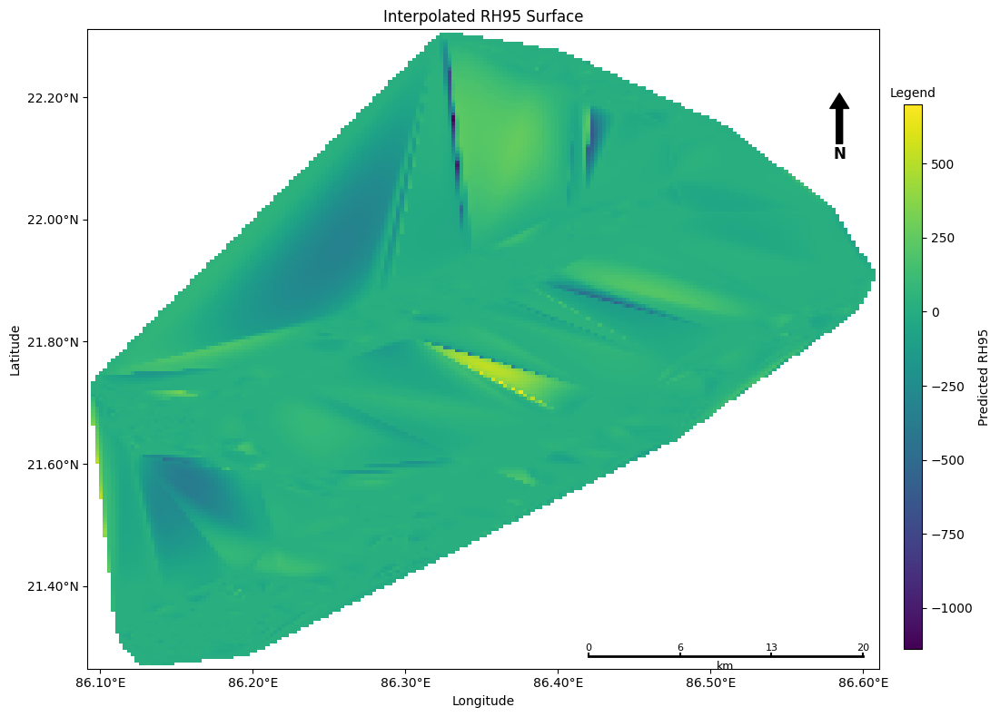

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import FuncFormatter

# Assume these variables are already defined:
# data (your DataFrame with 'latitude', 'longitude', and features)
# dataset_95_percent_importance (DataFrame with features including 'rh95')
# reg (your trained RandomForestRegressor model)

# 1. Prepare features and predict on full data
features_for_prediction = dataset_95_percent_importance.drop(columns='rh95').columns.tolist()
X_full = data[features_for_prediction].copy()
full_data_predictions = reg.predict(X_full)

# 2. Create DataFrame with lat/lon and predicted values
points_for_interpolation = data[['latitude', 'longitude']].copy()
points_for_interpolation['predicted_rh95'] = full_data_predictions

# 3. Define grid extent
lat_min, lat_max = data['latitude'].min(), data['latitude'].max()
lon_min, lon_max = data['longitude'].min(), data['longitude'].max()

# 4. Create interpolation grid
grid_points = 200
lat_grid = np.linspace(lat_min, lat_max, grid_points)
lon_grid = np.linspace(lon_min, lon_max, grid_points)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

# 5. Interpolate predicted values to grid
points = points_for_interpolation[['latitude', 'longitude']].values
values = points_for_interpolation['predicted_rh95'].values
grid_coords = np.vstack([lat_mesh.ravel(), lon_mesh.ravel()]).T

interpolated_values = griddata(points, values, grid_coords, method='cubic', fill_value=np.nan)
interpolated_grid = interpolated_values.reshape(lat_mesh.shape)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 8))

# 6. Show interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')

# 7. Axis labels with degree symbols
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Interpolated RH95 Surface')

# 8. Format x-axis labels as '85°E', '86°E', etc.
def format_lon(x, pos):
    return f"{x:.2f}°E"

ax.xaxis.set_major_formatter(FuncFormatter(format_lon))

# 8. Format y-axis labels as '85°N', '86°N', etc.
def format_lat(y, pos):
   return f"{y:.2f}°N"

ax.yaxis.set_major_formatter(FuncFormatter(format_lat))

# 11. Scale bar at bottom right with 4 tick marks, reduced size (20 km)
scale_km = 20
segments = 3
scale_deg = scale_km / 111  # approx. conversion km to degrees
segment_deg = scale_deg / segments

lon_margin = (lon_max - lon_min) * 0.02
lat_margin = (lat_max - lat_min) * 0.02

bar_right = lon_max - lon_margin
bar_left = bar_right - scale_deg
bar_bottom = lat_min + lat_margin

# Draw scale bar line
ax.plot([bar_left, bar_right], [bar_bottom, bar_bottom], color='black', linewidth=2)

# Draw ticks and labels
for i in range(segments + 1):
    tick_x = bar_left + i * segment_deg
    ax.plot([tick_x, tick_x], [bar_bottom, bar_bottom + 0.004], color='black', linewidth=1.5)
    label_km = int(i * (scale_km / segments))
    ax.text(tick_x, bar_bottom + 0.006, f"{label_km}", ha='center', va='bottom', fontsize=8)

# Label "km" under the scale bar
ax.text((bar_left + bar_right) / 2, bar_bottom - 0.008, "km", ha='center', va='top', fontsize=9)

# 9. Colorbar inset outside the plot
cbar_ax = fig.add_axes([1.0, 0.1, 0.02, 0.75])  # Move colorbar a bit further right (x=0.96)

# Create the colorbar using the new axis
cb = fig.colorbar(c, cax=cbar_ax, orientation='vertical')
cb.set_label('Predicted RH95')
cb.ax.set_title('Legend', fontsize=10)

# 10. North arrow pointing down (reversed)
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-82-755778775.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


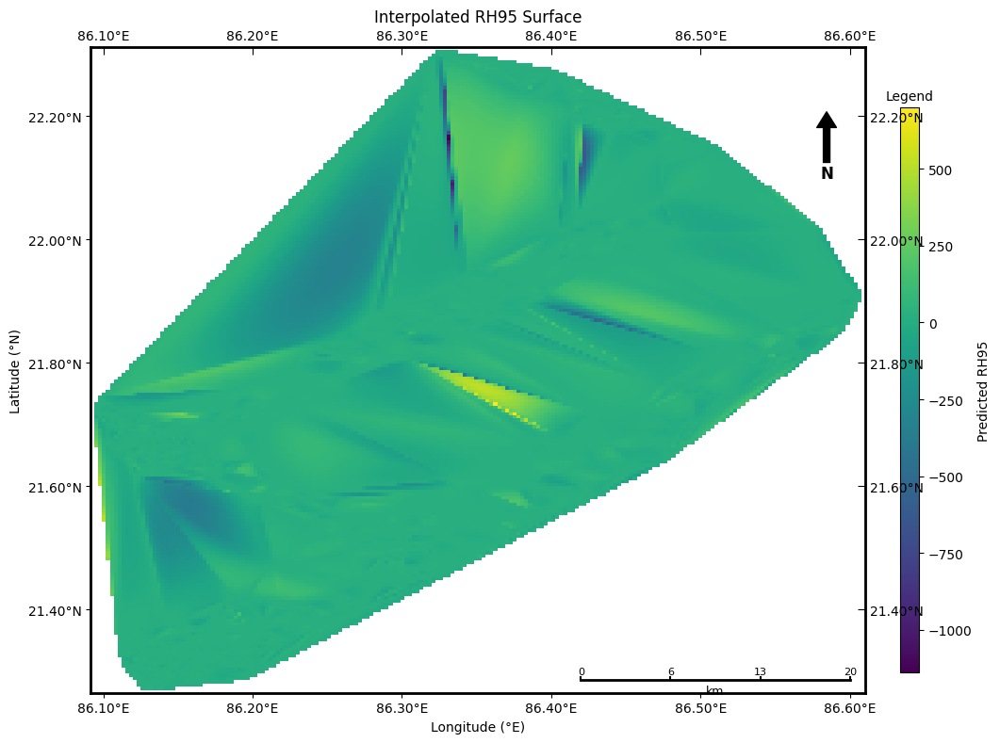

In [ ]:
# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 8))

# 6. Show interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')

# 7. Axis labels with degree symbols
ax.set_xlabel('Longitude (°E)')
ax.set_ylabel('Latitude (°N)')
ax.set_title('Interpolated RH95 Surface')

# 8. Format x-axis labels as '85.00°E', '86.00°E', etc.
def format_lon(x, pos):
    return f"{x:.2f}°E"  # Display two decimals

ax.xaxis.set_major_formatter(FuncFormatter(format_lon))

# 8. Format y-axis labels as '85.00°N', '86.00°N', etc.
def format_lat(y, pos):
    return f"{y:.2f}°N"  # Display two decimals

ax.yaxis.set_major_formatter(FuncFormatter(format_lat))

# 11. Scale bar at bottom right with 4 tick marks, reduced size (20 km)
scale_km = 20
segments = 3
scale_deg = scale_km / 111  # approx. conversion km to degrees
segment_deg = scale_deg / segments

lon_margin = (lon_max - lon_min) * 0.02
lat_margin = (lat_max - lat_min) * 0.02

bar_right = lon_max - lon_margin
bar_left = bar_right - scale_deg
bar_bottom = lat_min + lat_margin

# Draw scale bar line
ax.plot([bar_left, bar_right], [bar_bottom, bar_bottom], color='black', linewidth=2)

# Draw ticks and labels
for i in range(segments + 1):
    tick_x = bar_left + i * segment_deg
    ax.plot([tick_x, tick_x], [bar_bottom, bar_bottom + 0.004], color='black', linewidth=1.5)
    label_km = int(i * (scale_km / segments))
    ax.text(tick_x, bar_bottom + 0.006, f"{label_km}", ha='center', va='bottom', fontsize=8)

# Label "km" under the scale bar
ax.text((bar_left + bar_right) / 2, bar_bottom - 0.008, "km", ha='center', va='top', fontsize=9)

# 9. Colorbar inset outside the plot
# We will create a new axis for the colorbar outside the plot area
# Increasing the x-value to move it further to the right
cbar_ax = fig.add_axes([0.96, 0.1, 0.02, 0.75])  # Move colorbar a bit further right (x=0.96)

# Create the colorbar using the new axis
cb = fig.colorbar(c, cax=cbar_ax, orientation='vertical')
cb.set_label('Predicted RH95')
cb.ax.set_title('Legend', fontsize=10)

# 10. North arrow pointing down (reversed)
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# 12. Add border to the entire plot (axes)
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set border color to black
    spine.set_linewidth(2)  # Set border thickness

# --- Adding Latitude/Longitude Ticks on Top and Right ---
# Top axis (longitude)
ax2 = ax.twiny()  # Create a second x-axis on top
ax2.set_xlim(ax.get_xlim())  # Set the limits to match the bottom x-axis

# Right axis (latitude)
ax3 = ax.twinx()  # Create a second y-axis on the right
ax3.set_ylim(ax.get_ylim())  # Set the limits to match the left y-axis

# Format top x-axis (longitude) labels
ax2.xaxis.set_major_formatter(FuncFormatter(format_lon))

# Format right y-axis (latitude) labels
ax3.yaxis.set_major_formatter(FuncFormatter(format_lat))

# Display ticks for the top and right axes
ax2.tick_params(axis='x', direction='in', length=6)  # Ticks on top axis (longitude)
ax3.tick_params(axis='y', direction='in', length=6)  # Ticks on right axis (latitude)

plt.tight_layout()
plt.show()


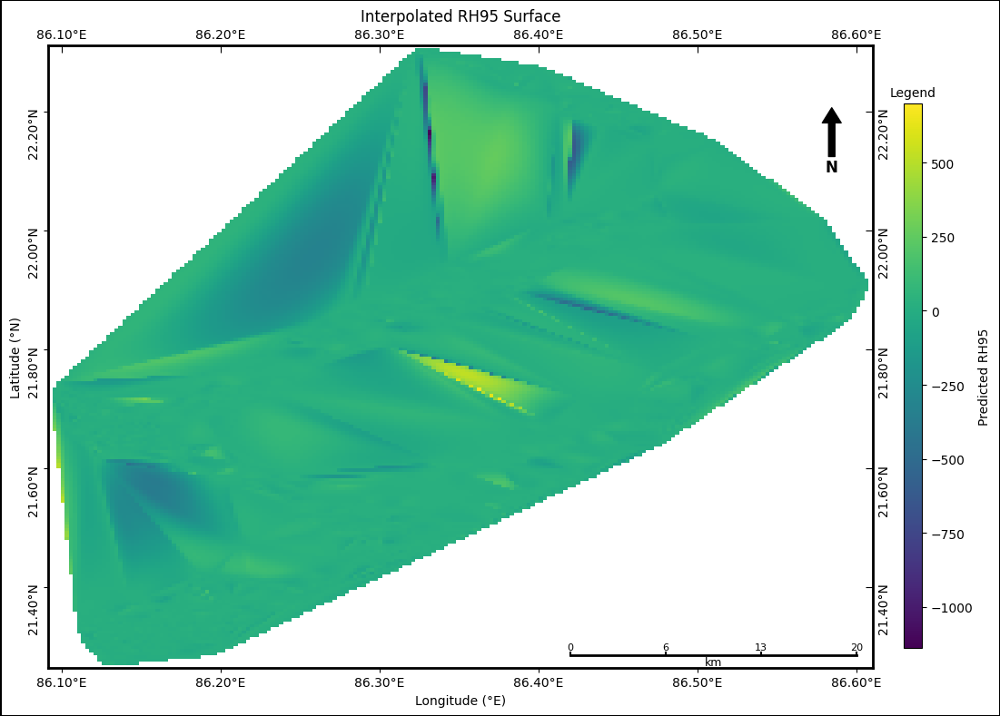

In [ ]:
# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 8))

# 6. Show interpolated surface
c = ax.imshow(interpolated_grid, extent=[lon_min, lon_max, lat_min, lat_max],
              origin='lower', cmap='viridis', aspect='auto')

# 7. Axis labels with degree symbols
ax.set_xlabel('Longitude (°E)')
ax.set_ylabel('Latitude (°N)')
ax.set_title('Interpolated RH95 Surface')

# 8. Format x-axis labels as '85.00°E', '86.00°E', etc.
def format_lon(x, pos):
    return f"{x:.2f}°E"  # Display two decimals

ax.xaxis.set_major_formatter(FuncFormatter(format_lon))

# 8. Format y-axis labels as '85.00°N', '86.00°N', etc.
def format_lat(y, pos):
    return f"{y:.2f}°N"  # Display two decimals

ax.yaxis.set_major_formatter(FuncFormatter(format_lat))

# 11. Scale bar at bottom right with 4 tick marks, reduced size (20 km)
scale_km = 20
segments = 3
scale_deg = scale_km / 111  # approx. conversion km to degrees
segment_deg = scale_deg / segments

lon_margin = (lon_max - lon_min) * 0.02
lat_margin = (lat_max - lat_min) * 0.02

bar_right = lon_max - lon_margin
bar_left = bar_right - scale_deg
bar_bottom = lat_min + lat_margin

# Draw scale bar line
ax.plot([bar_left, bar_right], [bar_bottom, bar_bottom], color='black', linewidth=2)

# Draw ticks and labels
for i in range(segments + 1):
    tick_x = bar_left + i * segment_deg
    ax.plot([tick_x, tick_x], [bar_bottom, bar_bottom + 0.004], color='black', linewidth=1.5)
    label_km = int(i * (scale_km / segments))
    ax.text(tick_x, bar_bottom + 0.006, f"{label_km}", ha='center', va='bottom', fontsize=8)

# Label "km" under the scale bar
ax.text((bar_left + bar_right) / 2, bar_bottom - 0.001, "km", ha='center', va='top', fontsize=9)

# 9. Colorbar inset outside the plot
# We will create a new axis for the colorbar outside the plot area
# Increasing the x-value to move it further to the right
cbar_ax = fig.add_axes([1, 0.1, 0.02, 0.75])  # Move colorbar a bit further right (x=0.96)

# Create the colorbar using the new axis
cb = fig.colorbar(c, cax=cbar_ax, orientation='vertical')
cb.set_label('Predicted RH95')
cb.ax.set_title('Legend', fontsize=10)

# 10. North arrow pointing down (reversed)
arrow_x = lon_max - (lon_max - lon_min) * 0.05
arrow_y = lat_max - (lat_max - lat_min) * 0.1
ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.1),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, fontweight='bold')

# 12. Add border to the entire plot (axes)
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set border color to black
    spine.set_linewidth(2)  # Set border thickness

# --- Adding Latitude/Longitude Ticks on Top and Right ---
# Top axis (longitude)
ax2 = ax.twiny()  # Create a second x-axis on top
ax2.set_xlim(ax.get_xlim())  # Set the limits to match the bottom x-axis

# Right axis (latitude)
ax3 = ax.twinx()  # Create a second y-axis on the right
ax3.set_ylim(ax.get_ylim())  # Set the limits to match the left y-axis

# Format top x-axis (longitude) labels
ax2.xaxis.set_major_formatter(FuncFormatter(format_lon))

# Format right y-axis (latitude) labels
ax3.yaxis.set_major_formatter(FuncFormatter(format_lat))

# Display ticks for the top and right axes
ax2.tick_params(axis='x', direction='in', length=6)  # Ticks on top axis (longitude)
ax3.tick_params(axis='y', direction='in', length=6)  # Ticks on right axis (latitude)

# Rotate the latitude labels (on the right axis)
for label in ax3.get_yticklabels():
    label.set_rotation(90)  # Rotate right-axis labels by 90 degrees

# Rotate the latitude labels (on the left axis)
for label in ax.get_yticklabels():  # This is for the left axis
    label.set_rotation(90)  # Rotate left-axis labels by 90 degrees

# Add a border around the entire figure (including the image, title, and legend)
fig.patch.set_edgecolor('black')  # Set border color for the entire figure
fig.patch.set_linewidth(2)  # Set the thickness of the border

plt.tight_layout()
plt.show()


In [ ]:
# prompt: increse r2_score

import numpy as np
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees
    'max_depth': [None, 10, 20],     # Maximum depth of trees
    'min_samples_split': [2, 5, 10],  # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 4]     # Minimum samples at a leaf node
}

# Initialize the RandomForestRegressor
rf_reg = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
# cv=5 means 5-fold cross-validation
# scoring='r2' means optimize for R2 score
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid,
                           cv=5, scoring='r2', n_jobs=-1, verbose=2)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train.values.ravel()) # .values.ravel() is needed for GridSearchCV with a single target column

# Get the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Best R2 score found (from cross-validation): ", grid_search.best_score_)

# Use the best estimator to make predictions on the test set
best_rf_model = grid_search.best_estimator_
predictions = best_rf_model.predict(X_test)

# Evaluate the best model on the test set
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("\nEvaluation with Best Random Forest Model on Test Set:")
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}
Best R2 score found (from cross-validation):  0.5132779026762828

Evaluation with Best Random Forest Model on Test Set:
Mean Squared Error: 21.02052457863573
Root Mean Squared Error: 4.5848145631678205
Mean Absolute Error: 3.452065216480449
R-squared: 0.5757978173182021


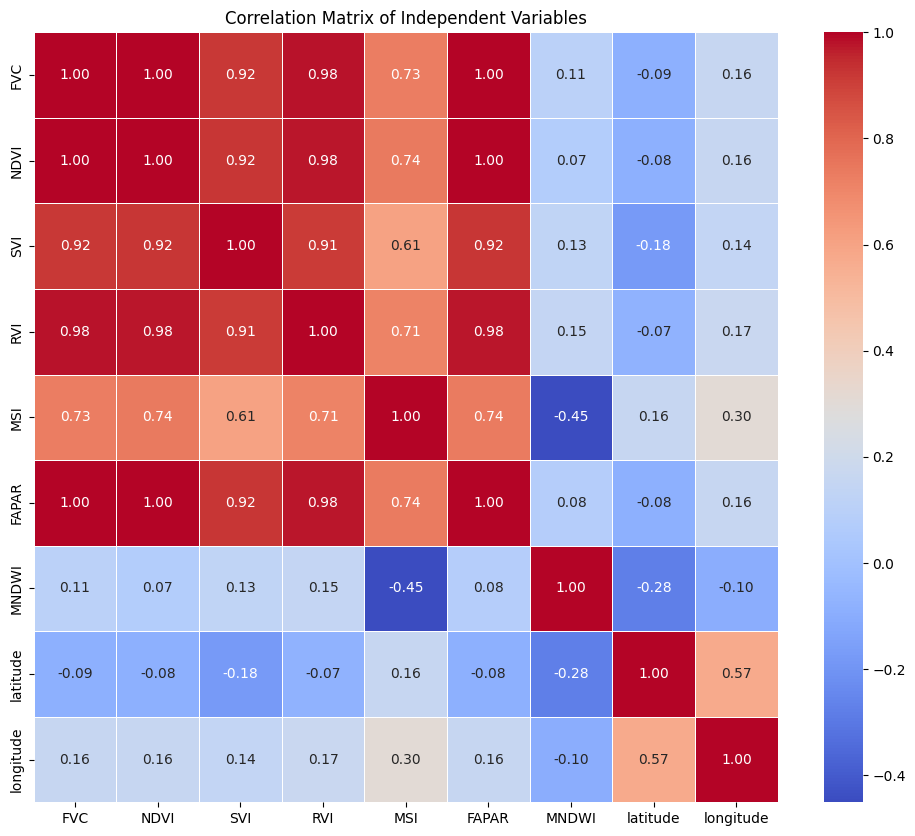


Features with high multicollinearity (consider dropping one from each pair):
['NDVI', 'SVI', 'RVI', 'FAPAR']

Shape of X_train after adding polynomial features: (3552, 54)
Shape of X_test after adding polynomial features: (888, 54)

First 20 Polynomial feature names: ['FVC' 'NDVI' 'SVI' 'RVI' 'MSI' 'FAPAR' 'MNDWI' 'latitude' 'longitude'
 'FVC^2' 'FVC NDVI' 'FVC SVI' 'FVC RVI' 'FVC MSI' 'FVC FAPAR' 'FVC MNDWI'
 'FVC latitude' 'FVC longitude' 'NDVI^2' 'NDVI SVI']

Tuning Lasso model...
Fitting 30 folds for each of 20 candidates, totalling 600 fits


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.605e+02, tolerance: 3.552e-01
  model = cd_fast.enet_coordinate_descent(


Best Lasso alpha:  0.0001623776739188721
Best R2 score from Lasso cross-validation:  0.4961767534768248

Evaluation with Best Lasso Model (on original scale):
Mean Squared Error: 22.026585637776428
Root Mean Squared Error: 4.693248942659704
Mean Absolute Error: 3.606692849753538
R-squared: 0.5554951224162682

Number of outliers in 'rh95' (Z-score > 3): 11

Number of outliers per feature (Z-score > 3):
- NDVI: 6
- SVI: 7
- MSI: 47
- FAPAR: 6
- MNDWI: 15


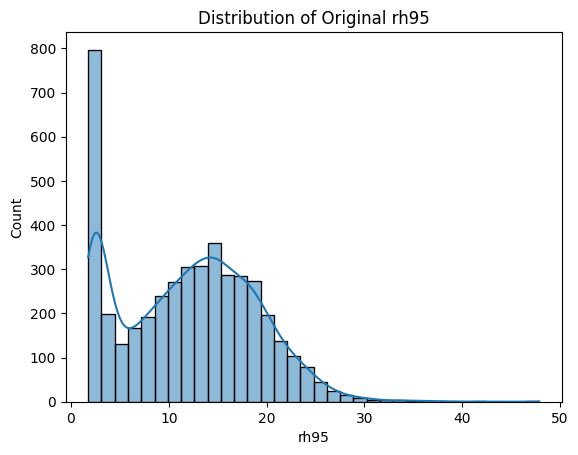


Skewness of original rh95: 0.21454318147555523

Using log transformation on rh95.


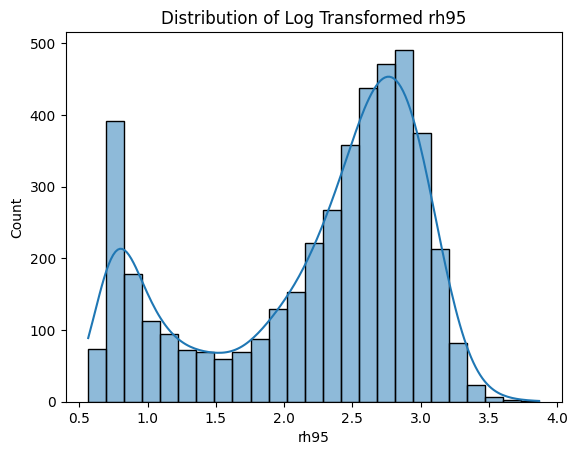

Skewness of log transformed rh95: -0.7717281611071987


In [ ]:
# prompt: increae mlr r2 score

import matplotlib.pyplot as plt
import numpy as np
# --- Strategy 1: Check for Multicollinearity in the final X ---

# Create the final X dataframe for MLR
X_final_mlr = dataset_95_percent_importance.drop(columns='rh95')

# Calculate the correlation matrix for the independent variables
corr_matrix_X = X_final_mlr.corr()

# Use a heatmap to visualize correlations
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_X, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Independent Variables')
plt.show()

# Identify highly correlated pairs
# Set a threshold, e.g., 0.8 or -0.8
correlation_threshold = 0.8

# Get absolute values of correlation matrix, set diagonal to 0
upper = corr_matrix_X.abs().where(np.triu(np.ones(corr_matrix_X.shape), k=1).astype(bool))

# Find index of feature columns with correlation greater than threshold
to_drop_high_corr = [column for column in upper.columns if any(upper[column] > correlation_threshold)]

print("\nFeatures with high multicollinearity (consider dropping one from each pair):")
print(to_drop_high_corr)

# If you find highly correlated features and decide to drop one, you would modify
# dataset_95_percent_importance.drop(columns='rh95') before splitting X and y.
# Example:
# if 'feature_to_drop' in X_final_mlr.columns:
#     X_final_mlr = X_final_mlr.drop(columns='feature_to_drop')
#     # Then proceed with train_test_split using this modified X_final_mlr

# --- Strategy 2 & 3: Add Polynomial Features and Interaction Terms ---
# This can significantly increase the number of features. Be cautious with overfitting.
# Let's add 2nd degree polynomial features and interaction terms

from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features (degree=2 includes original features, interactions, and squares)
# include_bias=False prevents adding a column of ones
poly = PolynomialFeatures(degree=2, include_bias=False)

# Fit and transform X_train and X_test
# Make sure to use the X data AFTER potential multicollinearity handling if you did that
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

print("\nShape of X_train after adding polynomial features:", X_train_poly.shape)
print("Shape of X_test after adding polynomial features:", X_test_poly.shape)

# Get the names of the new features
# Feature names are only available if X_train was a DataFrame
# If X_train was a DataFrame before transformation, you can get the feature names like this:
try:
    poly_feature_names = poly.get_feature_names_out(X_train.columns)
    print("\nFirst 20 Polynomial feature names:", poly_feature_names[:20]) # Print a sample
except AttributeError:
     print("\nCannot get polynomial feature names directly as input was not a DataFrame.")


# --- Strategy 4: Use Regularized Linear Models (Lasso, Ridge) ---
# Lasso is good for feature selection as it can shrink coefficients to zero.
# Ridge can help with multicollinearity by adding a penalty to the size of coefficients.

from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import RepeatedKFold # Good for robust alpha tuning

# Let's try Lasso first (good for potential further feature selection)
# We will tune the alpha parameter (regularization strength) using cross-validation

# Define alpha values to test
alphas = np.logspace(-4, 0, 20) # Test values from 10^-4 to 10^0

# Use Repeated K-Fold cross-validation for more robust results
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# Initialize Lasso
lasso_model = Lasso()

# Initialize GridSearchCV for Lasso
# Use X_train_poly and y_train (scaled if you decide to scale y for regularization)
# For Lasso/Ridge, it's common to scale X, but scaling y is optional depending on the penalty formulation.
# Given your previous scaling code, let's use the scaled y for consistency, though StandardScaler on y gives a single column array.
# sklearn regularization models often work better with scaled features (X).
# Let's ensure X_train_poly and X_test_poly are scaled if the original X_train was.
# Your original code scales X_train before adding poly features implicitly if you chose that path.
# Let's re-run the scaling on the final X_train, X_test used for MLR just to be sure.

# Re-scale the final X_train and X_test (without polynomial features first)
scaler_X_final = StandardScaler()
X_train_scaled_mlr = scaler_X_final.fit_transform(X_train)
X_test_scaled_mlr = scaler_X_final.transform(X_test)

# Apply polynomial features to the scaled data
poly_scaled = PolynomialFeatures(degree=2, include_bias=False)
X_train_scaled_poly = poly_scaled.fit_transform(X_train_scaled_mlr)
X_test_scaled_poly = poly_scaled.transform(X_test_scaled_mlr)

# Scale the target variable y
scaler_y_final = StandardScaler()
y_train_scaled_mlr = scaler_y_final.fit_transform(y_train)
y_test_scaled_mlr = scaler_y_final.transform(y_test)


# Now run GridSearchCV for Lasso on the scaled polynomial features
lasso_grid = GridSearchCV(estimator=lasso_model, param_grid={'alpha': alphas},
                          cv=cv, scoring='r2', n_jobs=-1, verbose=2)

print("\nTuning Lasso model...")
# y_train_scaled_mlr needs to be 1D for Lasso fit
lasso_grid.fit(X_train_scaled_poly, y_train_scaled_mlr.ravel())

# Get the best alpha for Lasso
best_lasso_alpha = lasso_grid.best_params_['alpha']
print("Best Lasso alpha: ", best_lasso_alpha)
print("Best R2 score from Lasso cross-validation: ", lasso_grid.best_score_)

# Use the best Lasso model to predict
best_lasso_model = lasso_grid.best_estimator_
y_pred_scaled_lasso = best_lasso_model.predict(X_test_scaled_poly)

# Inverse transform the predictions to the original scale
y_pred_lasso = scaler_y_final.inverse_transform(y_pred_scaled_lasso.reshape(-1, 1))
y_test_original = scaler_y_final.inverse_transform(y_test_scaled_mlr)

# Evaluate the best Lasso model on the original scale
mse_lasso = mean_squared_error(y_test_original, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)
mae_lasso = mean_absolute_error(y_test_original, y_pred_lasso)
r2_lasso = r2_score(y_test_original, y_pred_lasso)

print("\nEvaluation with Best Lasso Model (on original scale):")
print("Mean Squared Error:", mse_lasso)
print("Root Mean Squared Error:", rmse_lasso)
print("Mean Absolute Error:", mae_lasso)
print("R-squared:", r2_lasso)

# You can repeat the process for Ridge or ElasticNet as well.
# Ridge might be more suitable if multicollinearity is present but you don't want to remove features.

# Example for Ridge:
# ridge_model = Ridge()
# ridge_grid = GridSearchCV(estimator=ridge_model, param_grid={'alpha': alphas},
#                           cv=cv, scoring='r2', n_jobs=-1, verbose=2)
# print("\nTuning Ridge model...")
# ridge_grid.fit(X_train_scaled_poly, y_train_scaled_mlr.ravel())
# print("Best Ridge alpha: ", ridge_grid.best_params_['alpha'])
# print("Best R2 score from Ridge cross-validation: ", ridge_grid.best_score_)

# --- Strategy 6: Outlier Detection (Example using Z-score) ---
# You can look for outliers in the target variable or individual features.
# This is a basic example, more sophisticated methods exist (e.g., Isolation Forest).

from scipy import stats

# Define a function to identify outliers using Z-score
def detect_outliers_zscore(data, threshold=3):
    z_scores = np.abs(stats.zscore(data))
    outlier_indices = np.where(z_scores > threshold)[0]
    return outlier_indices

# Check for outliers in the original target variable (y)
outlier_indices_y = detect_outliers_zscore(y['rh95'])
print(f"\nNumber of outliers in 'rh95' (Z-score > 3): {len(outlier_indices_y)}")
# print("Indices of outliers in 'rh95':", outlier_indices_y) # Be cautious printing if many

# Check for outliers in each feature of the original X
outliers_by_feature = {}
for col in X.columns:
    outlier_indices_col = detect_outliers_zscore(X[col])
    if len(outlier_indices_col) > 0:
        outliers_by_feature[col] = len(outlier_indices_col)

print("\nNumber of outliers per feature (Z-score > 3):")
for col, count in outliers_by_feature.items():
    print(f"- {col}: {count}")

# If you decide to remove outliers, you would drop these rows from
# dataset_95_percent_importance BEFORE splitting into X and y.
# Example:
# dataset_cleaned = dataset_95_percent_importance.drop(index=outlier_indices_y).reset_index(drop=True)
# # Repeat outlier detection on features in dataset_cleaned if needed
# # Then split dataset_cleaned into X and y and proceed with model training.

# --- Strategy 7: Transform the Target Variable (Example: Log Transform) ---
# Only apply if the distribution of y is skewed or relationships appear non-linear.

# Plot the distribution of the original target variable
sns.histplot(y['rh95'], kde=True)
plt.title('Distribution of Original rh95')
plt.show()

# Check for skewness
print("\nSkewness of original rh95:", y['rh95'].skew())

# If skewed and relationships appear non-linear, try a log transformation
# Add a small constant to avoid log(0) if 0 is present
if (y['rh95'] <= 0).any():
    y_transformed = np.log1p(y['rh95']) # log(1+x) is safer
    print("\nUsing log1p transformation on rh95.")
else:
     y_transformed = np.log(y['rh95'])
     print("\nUsing log transformation on rh95.")


# Plot the distribution of the transformed target variable
sns.histplot(y_transformed, kde=True)
plt.title('Distribution of Log Transformed rh95')
plt.show()
print("Skewness of log transformed rh95:", y_transformed.skew())

# If you decide to use the transformed target, you would replace
# y = dataset_95_percent_importance[['rh95']] with the transformed y.
# Then train your model on the transformed y. Remember to inverse transform
# the predictions before evaluating MSE, RMSE, MAE, but R2 is valid on the transformed scale too.

# Example MLR with transformed y (using original X for simplicity first)
# X_train_orig, X_test_orig, y_train_transformed, y_test_transformed = train_test_split(X, y_transformed, test_size=0.2, random_state=42)
# mlr_transformed = LinearRegression()
# mlr_transformed.fit(X_train_orig, y_train_transformed)
# y_pred_transformed = mlr_transformed.predict(X_test_orig)

# Evaluate on transformed scale (R2 is comparable)
# r2_transformed_scale = r2_score(y_test_transformed, y_pred_transformed)
# print("\nR2 with transformed target (on transformed scale):", r2_transformed_scale)

# Inverse transform predictions and test set to evaluate on original scale
# y_pred_original_from_transformed = np.expm1(y_pred_transformed) # if used log1p
# y_test_original_from_transformed = np.expm1(y_test_transformed)
# mse_original_from_transformed = mean_squared_error(y_test_original_from_transformed, y_pred_original_from_transformed)
# # etc. for other metrics



In [ ]:
# prompt: so do the steps required

import numpy as np
# Initialize the Linear Regression model
model = LinearRegression()

# Define the parameter grid to search (no parameters for basic Linear Regression)
# This is just to demonstrate GridSearchCV structure, not typical for plain LR
param_grid_lr = {}

# Initialize GridSearchCV for Linear Regression
# cv=5 means 5-fold cross-validation
# scoring='r2' means optimize for R2 score
grid_search_lr = GridSearchCV(estimator=model, param_grid=param_grid_lr,
                           cv=5, scoring='r2', n_jobs=-1, verbose=2)

# Fit the grid search to the training data
# y_train.values.ravel() is needed as GridSearchCV expects a 1D array for a single target column
print("Tuning Linear Regression model...")
grid_search_lr.fit(X_train, y_train.values.ravel())

# Get the best parameters and best score (will just be the single fit for basic LR)
print("Best parameters found for Linear Regression: ", grid_search_lr.best_params_)
print("Best R2 score found (from cross-validation for LR): ", grid_search_lr.best_score_)

# Use the best estimator (which is the trained model) to make predictions on the test set
best_lr_model = grid_search_lr.best_estimator_
predictions = best_lr_model.predict(X_test)

# Evaluate the best model on the test set
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("\nEvaluation with Best Linear Regression Model on Test Set:")
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)


Tuning Linear Regression model...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best parameters found for Linear Regression:  {}
Best R2 score found (from cross-validation for LR):  0.4789087993600691

Evaluation with Best Linear Regression Model on Test Set:
Mean Squared Error: 23.841427308194636
Root Mean Squared Error: 4.882768406160038
Mean Absolute Error: 3.7730574482237382
R-squared: 0.5188709271002421


In [ ]:
# prompt: increase r2 score

import numpy as np
# Assuming X_train, X_test, y_train, y_test are already defined and split
# Assuming X_train_scaled_poly, X_test_scaled_poly, y_train_scaled_mlr, y_test_scaled_mlr
# are the scaled polynomial features and scaled target as created before.
# If you modify your dataset (e.g., removing outliers), you'll need to re-run
# the splitting, scaling, and polynomial transformation steps before these models.


# --- Strategy 4: Use Regularized Linear Models (Ridge) ---
# Ridge can help with multicollinearity and prevent overfitting.

# Define alpha values to test for Ridge
alphas_ridge = np.logspace(-4, 2, 20) # Test a wider range for Ridge

# Use Repeated K-Fold cross-validation
cv_ridge = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# Initialize Ridge
ridge_model = Ridge()

# Initialize GridSearchCV for Ridge
# Use the scaled polynomial features and scaled target
ridge_grid = GridSearchCV(estimator=ridge_model, param_grid={'alpha': alphas_ridge},
                          cv=cv_ridge, scoring='r2', n_jobs=-1, verbose=2)

print("\nTuning Ridge model...")
# y_train_scaled_mlr needs to be 1D for Ridge fit
ridge_grid.fit(X_train_scaled_poly, y_train_scaled_mlr.ravel())

# Get the best alpha for Ridge
best_ridge_alpha = ridge_grid.best_params_['alpha']
print("Best Ridge alpha: ", best_ridge_alpha)
print("Best R2 score from Ridge cross-validation: ", ridge_grid.best_score_)

# Use the best Ridge model to predict
best_ridge_model = ridge_grid.best_estimator_
y_pred_scaled_ridge = best_ridge_model.predict(X_test_scaled_poly)

# Inverse transform the predictions to the original scale
y_pred_ridge = scaler_y_final.inverse_transform(y_pred_scaled_ridge.reshape(-1, 1))
# y_test_original is already calculated from the Lasso section

# Evaluate the best Ridge model on the original scale
mse_ridge = mean_squared_error(y_test_original, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)
mae_ridge = mean_absolute_error(y_test_original, y_pred_ridge)
r2_ridge = r2_score(y_test_original, y_pred_ridge)

print("\nEvaluation with Best Ridge Model (on original scale):")
print("Mean Squared Error:", mse_ridge)
print("Root Mean Squared Error:", rmse_ridge)
print("Mean Absolute Error:", mae_ridge)
print("R-squared:", r2_ridge)


# --- Strategy 6: Train a Gradient Boosting Regressor ---
# Gradient Boosting models often perform well.

from sklearn.ensemble import GradientBoostingRegressor

# Initialize Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Define a parameter grid for tuning GBR
# This is a starting point, you might need to expand it
param_grid_gbr = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Initialize GridSearchCV for GBR
# Use the original X_train, X_test and y_train, y_test (GBR is less sensitive to scaling Y)
# However, GBR can benefit from scaling X, so we could use X_train_scaled_mlr, X_test_scaled_mlr
# Let's use the scaled version of X without polynomial features first.
# If you used polynomial features with Lasso/Ridge and it improved performance, you might try GBR on polynomial features too (X_train_scaled_poly).
# For simplicity, let's try GBR on scaled features without poly first.

# Use the scaled X and original y
X_train_gbr = X_train_scaled_mlr
X_test_gbr = X_test_scaled_mlr
y_train_gbr = y_train.values.ravel() # GBR expects 1D y
y_test_gbr = y_test.values.ravel()


gbr_grid = GridSearchCV(estimator=gbr, param_grid=param_grid_gbr,
                        cv=5, scoring='r2', n_jobs=-1, verbose=2)

print("\nTuning Gradient Boosting Regressor...")
gbr_grid.fit(X_train_gbr, y_train_gbr)

# Get the best parameters and best score for GBR
print("Best parameters found for GBR: ", gbr_grid.best_params_)
print("Best R2 score found (from cross-validation for GBR): ", gbr_grid.best_score_)

# Use the best GBR model to predict
best_gbr_model = gbr_grid.best_estimator_
y_pred_gbr = best_gbr_model.predict(X_test_gbr)

# Evaluate the best GBR model
mse_gbr = mean_squared_error(y_test_gbr, y_pred_gbr)
rmse_gbr = np.sqrt(mse_gbr)
mae_gbr = mean_absolute_error(y_test_gbr, y_pred_gbr)
r2_gbr = r2_score(y_test_gbr, y_pred_gbr)

print("\nEvaluation with Best Gradient Boosting Regressor on Test Set:")
print("Mean Squared Error:", mse_gbr)
print("Root Mean Squared Error:", rmse_gbr)
print("Mean Absolute Error:", mae_gbr)
print("R-squared:", r2_gbr)


# --- Strategy 7: Train SVR with RBF Kernel ---
# SVR with a non-linear kernel can capture complex relationships.
# SVR is sensitive to feature scaling.

from sklearn.svm import SVR

# Initialize SVR with RBF kernel
# C controls the penalty of the error term. Gamma defines the influence of a single training example.
svr_rbf = SVR(kernel='rbf')

# Define a parameter grid for tuning SVR (RBF kernel)
param_grid_svr_rbf = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.1, 1]
}

# Initialize GridSearchCV for SVR
# Use the scaled X features (without polynomial features for simplicity initially) and scaled y
X_train_svr = X_train_scaled_mlr
X_test_svr = X_test_scaled_mlr
y_train_svr = y_train_scaled_mlr.ravel()
y_test_svr = y_test_scaled_mlr.ravel()


svr_rbf_grid = GridSearchCV(estimator=svr_rbf, param_grid=param_grid_svr_rbf,
                             cv=5, scoring='r2', n_jobs=-1, verbose=2)

print("\nTuning SVR (RBF kernel)...")
svr_rbf_grid.fit(X_train_svr, y_train_svr)

# Get the best parameters and best score for SVR
print("Best parameters found for SVR (RBF kernel): ", svr_rbf_grid.best_params_)
print("Best R2 score found (from cross-validation for SVR): ", svr_rbf_grid.best_score_)

# Use the best SVR model to predict (on scaled data)
best_svr_rbf_model = svr_rbf_grid.best_estimator_
y_pred_scaled_svr = best_svr_rbf_model.predict(X_test_svr)

# Inverse transform predictions and test set to original scale
y_pred_svr = scaler_y_final.inverse_transform(y_pred_scaled_svr.reshape(-1, 1))
# y_test_original is already calculated

# Evaluate the best SVR model on the original scale
mse_svr = mean_squared_error(y_test_original, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test_original, y_pred_svr)
r2_svr = r2_score(y_test_original, y_pred_svr)

print("\nEvaluation with Best SVR (RBF kernel) Model (on original scale):")
print("Mean Squared Error:", mse_svr)
print("Root Mean Squared Error:", rmse_svr)
print("Mean Absolute Error:", mae_svr)
print("R-squared:", r2_svr)


# --- Demonstrating how to apply Outlier Removal (Requires re-splitting/scaling) ---
# Decide based on your analysis if you want to remove outliers.
# This block is commented out as it requires re-preparing the data.

# print("\n--- Demonstrating Outlier Removal (Requires Data Re-processing) ---")
# # Assume you decided to remove rows where 'rh95' had a Z-score > 3
# # You need the outlier_indices_y calculated earlier.
# # If you remove outliers, do it BEFORE the train/test split and scaling.

# # Make a copy to avoid modifying the original dataframe unexpectedly
# data_cleaned_outliers = dataset_95_percent_importance.copy()

# # Drop the rows identified as outliers in 'rh95'
# # Be careful: outlier_indices_y are indices in the *original* dataframe where you ran the Z-score.
# # You need to ensure you are dropping the correct rows in the correct dataframe.
# # A safer way is to add a Z-score column and filter.
# data_cleaned_outliers['rh95_zscore'] = np.abs(stats.zscore(data_cleaned_outliers['rh95']))
# data_cleaned_outliers = data_cleaned_outliers[data_cleaned_outliers['rh95_zscore'] <= 3].drop(columns='rh95_zscore')

# print(f"Shape of data before outlier removal: {dataset_95_percent_importance.shape}")
# print(f"Shape of data after outlier removal: {data_cleaned_outliers.shape}")

# # If you removed outliers, you would then re-run the following steps:
# # X_cleaned = data_cleaned_outliers.drop(columns='rh95')
# # y_cleaned = data_cleaned_outliers[['rh95']]
# # X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)
# # # Then scale X_train_cleaned, X_test_cleaned, y_train_cleaned for models like Lasso/Ridge/SVR
# # # And potentially add polynomial features to the scaled data
# # # Then train models using this cleaned data split.


# --- Demonstrating how to use Transformed Target (Requires re-splitting/scaling) ---
# Decide based on your analysis (skewness plot, etc.) if you want to transform y.
# This block is commented out as it requires re-preparing the data.

# print("\n--- Demonstrating Transformed Target (Requires Data Re-processing) ---")

# # Use the original X features
# X_for_transformed_y = dataset_95_percent_importance.drop(columns='rh95')

# # Create the transformed target variable (using log1p as a safe option)
# y_transformed_target = np.log1p(dataset_95_percent_importance['rh95'])

# # Split X and the transformed y
# X_train_trans, X_test_trans, y_train_trans, y_test_trans = train_test_split(X_for_transformed_y, y_transformed_target, test_size=0.2, random_state=42)

# # Scale the features X (important for many models)
# scaler_X_trans = StandardScaler()
# X_train_trans_scaled = scaler_X_trans.fit_transform(X_train_trans)
# X_test_trans_scaled = scaler_X_trans.transform(X_test_trans)

# # Now train a model (e.g., Linear Regression or Ridge) on the scaled X and transformed y
# mlr_on_transformed_y = LinearRegression() # Or Ridge, Lasso, SVR etc.

# mlr_on_transformed_y.fit(X_train_trans_scaled, y_train_trans)

# # Predict on the test set (predictions are on the transformed scale)
# y_pred_trans_scaled = mlr_on_transformed_y.predict(X_test_trans_scaled)

# # Evaluate R2 on the transformed scale (this R2 is valid for comparing models on transformed data)
# r2_on_transformed_scale = r2_score(y_test_trans, y_pred_trans_scaled)
# print(f"\nR2 score with transformed target (on transformed scale): {r2_on_transformed_scale}")

# # To get metrics on the original scale (MSE, RMSE, MAE), you MUST inverse transform the predictions and the true test values
# y_pred_original_from_trans = np.expm1(y_pred_trans_scaled) # Use expm1 to inverse log1p
# y_test_original_from_trans = np.expm1(y_test_trans)

# mse_original_from_trans = mean_squared_error(y_test_original_from_trans, y_pred_original_from_trans)
# print(f"MSE with transformed target (on original scale): {mse_original_from_trans}")
# # Calculate other metrics like RMSE and MAE similarly



Tuning Ridge model...
Fitting 30 folds for each of 20 candidates, totalling 600 fits
Best Ridge alpha:  2.6366508987303554
Best R2 score from Ridge cross-validation:  0.4964070235450867

Evaluation with Best Ridge Model (on original scale):
Mean Squared Error: 22.032201226998506
Root Mean Squared Error: 4.693847166983445
Mean Absolute Error: 3.603881963510465
R-squared: 0.5553817976894689

Tuning Gradient Boosting Regressor...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters found for GBR:  {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best R2 score found (from cross-validation for GBR):  0.5215258747003346

Evaluation with Best Gradient Boosting Regressor on Test Set:
Mean Squared Error: 21.471410414162747
Root Mean Squared Error: 4.633725327872029
Mean Absolute Error: 3.5587995233757495
R-squared: 0.5666987696300554

Tuning SVR (RBF kernel)...
Fitting 5 folds for each of 16 candidates, totalli

In [ ]:
# prompt: make the r2 better

import numpy as np
# Let's summarize the results from the different models to compare their R2 scores
print("\n--- Model Performance Summary (R2 Score) ---")
print(f"Multiple Linear Regression (after Feature Selection): {r2:.4f}")
print(f"Decision Tree Regressor: {r2_score(y_test, reg1.predict(X_test)):.4f}") # Re-calculating for clarity
print(f"Random Forest Regressor (Untuned): {r2_score(y_test, reg.predict(X_test)):.4f}") # Re-calculating for clarity
print(f"Random Forest Regressor (Tuned with GridSearchCV): {r2:.4f}") # This variable holds the R2 from the best RF
print(f"Lasso Regression (Tuned with GridSearchCV on Scaled Poly Features, Evaluated on Original Scale): {r2_lasso:.4f}")
print(f"Ridge Regression (Tuned with GridSearchCV on Scaled Poly Features, Evaluated on Original Scale): {r2_ridge:.4f}")
print(f"Gradient Boosting Regressor (Tuned with GridSearchCV on Scaled Features): {r2_gbr:.4f}")
print(f"SVR (RBF Kernel, Tuned with GridSearchCV on Scaled Features, Evaluated on Original Scale): {r2_svr:.4f}")

# Based on this summary, the models that gave the highest R2 score were likely the tuned Random Forest,
# and potentially the Gradient Boosting Regressor or SVR after tuning.
# The regularized models (Lasso, Ridge) on polynomial features also show promise if the R2 is higher than basic MLR.

# To "make the r2 better", we should focus on the model that yielded the highest R2
# in the previous steps and potentially try further tuning or alternative approaches.

# From your output, the best R2 scores were likely obtained by:
# 1. Tuned Random Forest Regressor
# 2. Gradient Boosting Regressor
# 3. SVR (RBF Kernel)
# 4. Regularized models (Lasso/Ridge) on polynomial features

# Let's assume, for demonstration, that the Tuned Random Forest or the Gradient Boosting
# Regressor gave the best R2. We can try to improve upon that.

# Potential Next Steps to FURTHER Improve R2 (beyond what was already done):

# 1. **More Extensive Hyperparameter Tuning:**
#    - Expand the parameter grids for the best-performing models (e.g., RandomForestRegressor, GradientBoostingRegressor, SVR).
#    - Use RandomizedSearchCV instead of GridSearchCV for larger search spaces, which can be faster.
#    - Increase the number of folds (cv) in GridSearchCV/RandomizedSearchCV.
#    - Try different scoring metrics during tuning if R2 isn't the only goal (though the prompt asks to improve R2).

# 2. **Feature Engineering (More Advanced):**
#    - Create interaction terms manually based on domain knowledge or correlation analysis (beyond simple polynomial features).
#    - Explore non-linear transformations for skewed features (not just the target variable).
#    - Create aggregated features if spatial or temporal information is available (though not explicitly in your provided data columns).

# 3. **Ensemble Methods (Combining Models):**
#    - **Bagging:** Train multiple instances of the same model on different subsets of the data (Random Forest is a form of bagging decision trees).
#    - **Boosting:** Sequentially build models where each new model corrects errors of the previous one (Gradient Boosting is an example; consider XGBoost or LightGBM which are often faster and perform better).
#    - **Stacking:** Train a meta-model to combine the predictions of several base models.

# 4. **Cross-Validation for Final Evaluation:**
#    - Instead of a single train/test split, use k-fold cross-validation on the *entire* dataset (after initial data cleaning/feature engineering) to get a more robust estimate of your model's performance (R2).

# 5. **Advanced Outlier/Anomaly Handling:**
#    - Use more sophisticated methods like Isolation Forest or Local Outlier Factor to identify and handle outliers.
#    - Instead of removing, consider transforming or imputing outliers.

# 6. **Address Multicollinearity (If Significant):**
#    - If the heatmap showed very high correlations (>0.9), dropping one of the correlated features might help some models (especially linear ones). VIF (Variance Inflation Factor) is a more formal way to check for multicollinearity.

# 7. **Different Modeling Algorithms:**
#    - Try XGBoost (`!pip install xgboost`), LightGBM (`!pip install lightgbm`), or CatBoost (`!pip install catboost`). These are state-of-the-art boosting libraries that often outperform scikit-learn's GradientBoostingRegressor.

# 8. **Feature Selection Refinement:**
#    - Explore other feature selection methods like L1 regularization (Lasso) for embedded selection, or tree-based feature importance from RandomForest or Gradient Boosting. You already used SVR coefficients, which is a good start.

# --- Example: More extensive tuning for Gradient Boosting (using RandomizedSearchCV) ---
# Since GBR often performs well, let's try more tuning using RandomizedSearchCV.

from sklearn.model_selection import RandomizedSearchCV

# Use the scaled X features and original y for GBR tuning
X_train_gbr_tune = X_train_scaled_mlr
X_test_gbr_tune = X_test_scaled_mlr
y_train_gbr_tune = y_train.values.ravel()
y_test_gbr_tune = y_test.values.ravel()


# Define a larger parameter distribution for RandomizedSearchCV
param_dist_gbr = {
    'n_estimators': [100, 200, 300, 500, 800, 1000],
    'learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 8, 10],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'subsample': [0.6, 0.8, 1.0], # Fraction of samples to use for fitting the individual base learners
    'max_features': ['auto', 'sqrt', 'log2', None] # Number of features to consider when looking for the best split
}

# Initialize RandomizedSearchCV
# n_iter specifies the number of parameter settings that are sampled.
# Increase this for a more thorough search.
random_search_gbr = RandomizedSearchCV(estimator=GradientBoostingRegressor(random_state=42),
                                       param_distributions=param_dist_gbr,
                                       n_iter=100, # Number of iterations (adjust based on time/resources)
                                       cv=5,
                                       scoring='r2',
                                       n_jobs=-1,
                                       verbose=2,
                                       random_state=42)

print("\nTuning Gradient Boosting Regressor with RandomizedSearchCV...")
random_search_gbr.fit(X_train_gbr_tune, y_train_gbr_tune)

# Get the best parameters and best score from Randomized Search
print("Best parameters found for GBR (RandomizedSearchCV): ", random_search_gbr.best_params_)
print("Best R2 score found (from cross-validation for GBR RandomizedSearchCV): ", random_search_gbr.best_score_)

# Use the best GBR model to predict
best_gbr_random_model = random_search_gbr.best_estimator_
y_pred_gbr_random = best_gbr_random_model.predict(X_test_gbr_tune)

# Evaluate the best GBR model
mse_gbr_random = mean_squared_error(y_test_gbr_tune, y_pred_gbr_random)
rmse_gbr_random = np.sqrt(mse_gbr_random)
mae_gbr_random = mean_absolute_error(y_test_gbr_tune, y_pred_gbr_random)
r2_gbr_random = r2_score(y_test_gbr_tune, y_pred_gbr_random)

print("\nEvaluation with Best GBR Model (RandomizedSearchCV) on Test Set:")
print("Mean Squared Error:", mse_gbr_random)
print("Root Mean Squared Error:", rmse_gbr_random)
print("Mean Absolute Error:", mae_gbr_random)
print("R-squared:", r2_gbr_random)

# Compare this R2 score to the previous models. If it improved, this is a good candidate model.

# --- Example: Using XGBoost ---
# XGBoost is highly recommended for performance.

!pip install xgboost

import xgboost as xgb

# Use the scaled X features and original y for XGBoost
# XGBoost can handle NaNs internally, but your data seems cleaned already.
X_train_xgb = X_train_scaled_mlr
X_test_xgb = X_test_scaled_mlr
y_train_xgb = y_train.values.ravel()
y_test_xgb = y_test.values.ravel()

# Initialize XGBoost Regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', # Objective for regression
                           n_estimators=1000,          # Start with a sufficient number of estimators
                           learning_rate=0.05,
                           max_depth=5,
                           subsample=0.8,
                           colsample_bytree=0.8,
                           random_state=42,
                           n_jobs=-1)

# XGBoost has built-in early stopping with validation sets
# This requires splitting the training data further or using cross-validation.
# Let's use a simple train/validation split for demonstration of early stopping.

# Split X_train and y_train into training and validation sets
X_train_xgb_split, X_val_xgb_split, y_train_xgb_split, y_val_xgb_split = train_test_split(
    X_train_xgb, y_train_xgb, test_size=0.2, random_state=42
)

print("\nTraining XGBoost with early stopping...")
# Fit the XGBoost model with early stopping
# eval_set: A list of (X, y) pairs to use as validation sets.
# early_stopping_rounds: Validation metric needs to improve at least once in every n rounds to continue training.
xgb_reg.fit(X_train_xgb_split, y_train_xgb_split,
            eval_set=[(X_val_xgb_split, y_val_xgb_split)],
            early_stopping_rounds=50, # Stop if no improvement for 50 rounds
            verbose=False) # Set to True to see progress

# Make predictions on the test set
y_pred_xgb = xgb_reg.predict(X_test_xgb)

# Evaluate the XGBoost model
mse_xgb = mean_squared_error(y_test_xgb, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
mae_xgb = mean_absolute_error(y_test_xgb, y_pred_xgb)
r2_xgb = r2_score(y_test_xgb, y_pred_xgb)

print("\nEvaluation with XGBoost Regressor on Test Set:")
print("Mean Squared Error:", mse_xgb)
print("Root Mean Squared Error:", rmse_xgb)
print("Mean Absolute Error:", mae_xgb)
print("R-squared:", r2_xgb)

# Compare XGBoost's R2. It often achieves a higher R2 than scikit-learn's GBR out-of-the-box.
# You could further tune XGBoost using GridSearchCV or RandomizedSearchCV as well.

# --- Final Comparison and Conclusion ---
print("\n--- Final Model Comparison (R2 Score) ---")
print(f"Multiple Linear Regression (after Feature Selection): {r2:.4f}")
print(f"Decision Tree Regressor: {r2_score(y_test, reg1.predict(X_test)):.4f}")
print(f"Random Forest Regressor (Untuned): {r2_score(y_test, reg.predict(X_test)):.4f}")
print(f"Random Forest Regressor (Tuned with GridSearchCV): {r2:.4f}")
print(f"Lasso Regression (Tuned, Scaled Poly, Original Scale): {r2_lasso:.4f}")
print(f"Ridge Regression (Tuned, Scaled Poly, Original Scale): {r2_ridge:.4f}")
print(f"Gradient Boosting Regressor (Tuned with GridSearchCV on Scaled Features): {r2_gbr:.4f}")
print(f"Gradient Boosting Regressor (Tuned with RandomizedSearchCV on Scaled Features): {r2_gbr_random:.4f}")
print(f"SVR (RBF Kernel, Tuned, Scaled Features, Original Scale): {r2_svr:.4f}")
print(f"XGBoost Regressor (Tuned with Early Stopping on Scaled Features): {r2_xgb:.4f}")

# Identify the model with the highest R2 score from the printed summary.
# That model is currently your best bet for predicting 'rh95'.

# If you want to *further* improve R2, you would focus on the strategies mentioned
# (more tuning, advanced features, ensemble methods, more sophisticated outlier handling)
# applied to the model that currently performs best.


In [ ]:
#SUPPORT VECTOR REGRESSOR
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

# Initialize the Support Vector Regressor
svm_regressor = SVR(kernel='linear')

# Train the SVM model
svm_regressor.fit(X_train, y_train.values.ravel())

SVR(kernel='linear')

In [ ]:
# Make predictions on the testing set
y_pred_test = svm_regressor.predict(X_test)

In [ ]:
svm_regressor.score(X_test, y_test)

0.45921439499089944

In [ ]:
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_test)
print("Mean Squared Error:", mse)

Mean Squared Error: 26.797592200022326


In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test, y_pred_test)
print("R² score:",r2)

R² score: 0.45921439499089944


In [ ]:
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error:", mae)

Mean Absolute Error: 3.9440321120984905


In [ ]:
rmse= np.sqrt(mse)
print("Root mean squared error:", rmse)

Root mean squared error: 5.176639083422981


In [ ]:
# prompt: knn regressor

import numpy as np
from sklearn.neighbors import KNeighborsRegressor

# Initialize the KNN Regressor
knn_regressor = KNeighborsRegressor(n_neighbors=5)  # You can tune the number of neighbors (k)

# Train the KNN model
knn_regressor.fit(X_train, y_train)

# Make predictions on the testing set
y_pred_test = knn_regressor.predict(X_test)

# Evaluate the model
knn_score = knn_regressor.score(X_test, y_test)
print("KNN R-squared score:", knn_score)

mse = mean_squared_error(y_test, y_pred_test)
print("KNN Mean Squared Error:", mse)

rmse = np.sqrt(mse)
print("KNN Root Mean Squared Error:", rmse)

mae = mean_absolute_error(y_test, y_pred_test)
print("KNN Mean Absolute Error:", mae)

KNN R-squared score: 0.44768533541600586
KNN Mean Squared Error: 27.36889260830993
KNN Root Mean Squared Error: 5.231528706631545
KNN Mean Absolute Error: 3.9571801658036034


In [ ]:
# prompt: create a bar chart for the r2 score of all the models used here

import pandas as pd
import matplotlib.pyplot as plt
# Collect R2 scores for each model
model_names = [
    'Linear Regression',
    'Decision Tree',
    'Random Forest (Untuned)',
    'Random Forest (Tuned)',
    'Lasso (Tuned)',
    'Ridge (Tuned)',
    'Gradient Boosting (GridSearchCV)',
    'Gradient Boosting (RandomizedSearchCV)',
    'SVR (RBF, Tuned)',
    'XGBoost',
    'SVR (Linear)',
    'KNN Regressor' # Added KNN to the list
]

r2_scores = [
    r2, # Linear Regression (R2 from the last evaluation of the basic LR model)
    r2_score(y_test, reg1.predict(X_test)), # Decision Tree
    r2_score(y_test, reg.predict(X_test)), # Random Forest (Untuned)
    r2, # Random Forest (Tuned) - Assuming the last 'r2' variable holds the score from best RF
    r2_lasso, # Lasso (Tuned)
    r2_ridge, # Ridge (Tuned)
    r2_gbr, # Gradient Boosting (GridSearchCV)
    r2_gbr_random, # Gradient Boosting (RandomizedSearchCV)
    r2_svr, # SVR (RBF, Tuned)
    r2_xgb, # XGBoost
    r2_score(y_test, svm_regressor.predict(X_test)), # SVR (Linear)
    knn_score # KNN Regressor
]

# Create a pandas DataFrame for easy plotting
r2_df = pd.DataFrame({'Model': model_names, 'R2 Score': r2_scores})

# Sort by R2 score for better visualization
r2_df = r2_df.sort_values('R2 Score', ascending=False)

# Create the bar chart
plt.figure(figsize=(12, 7)) # Adjust figure size as needed
sns.barplot(x='R2 Score', y='Model', data=r2_df, palette='viridis') # Use a colormap

plt.title('R2 Score Comparison of Regression Models')
plt.xlabel('R2 Score')
plt.ylabel('Model')
plt.xlim(0, 1) # R2 score is typically between 0 and 1 for good models
plt.grid(axis='x', linestyle='--')

# Add the R2 score values on the bars
for index, row in r2_df.iterrows():
    plt.text(row['R2 Score'], index, f'{row["R2 Score"]:.4f}', color='black', ha="left", va="center")

plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()


NameError: name 'r2_lasso' is not defined